**Task 1:**

Read the code of the Ant Colony Optimization algorithm (ACO) to familiarize yourself with the methods and variables used. Complete the code by filling the methods marked with #TODO in classes *Problem* and *TSP*.

In [200]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

**Pheromone update:**

$$\tau _{xy}\leftarrow (1-\rho )\tau _{xy}+\sum _{k}\Delta \tau _{xy}^{k}$$

$$\Delta \tau _{xy}^{k}={\begin{cases}q/L_{k}&{\mbox{if ant }}k{\mbox{ uses curve }}xy{\mbox{ in its tour}}\\0&{\mbox{otherwise}}\end{cases}}$$

In [220]:
class Problem:
    name_to_id = {} # translates the name of an element of a solution to its ID (to be used in arrays)
    parts_phero = []  # the amount of pheromones on an element of a solution
    parts_phero_delta = [] # the amount of pheromones added to the element by the ants in a given iteration
    
    min_prob = True # is this a minimization problem?
    
    alpha = 1 # importance of the pheromone level
    beta = 1 # importance of the heuristic knowledge
    ro = 0.5 # pheromone evaporation coefficient
    q = 10 # multiplier of the pheromone deposit

    
    ### these methods MUST be implemented in the INHERITING class ###
    
    # initialization of the problem: initializing name_to_id, parts_phero, 
    # parts_phero_delta and other arrays used by the problem
    def __init__(self):
        self.name_to_id = {}
        self.parts_phero = []
        self.parts_phero_delta = []
        pass

    # returns a random starting point for a new solution
    def initial_solution(self):
        return []
    
    # returns a list of all the elements making up a given solution
    def solution_parts(self, solution):
        return []

    # returns a value of the goal function for a given solution to the problem
    def solution_quality(self, solution):
        return 0
    
    # returns lists of the elements that can be added to the solution, 
    # and the probabilities of them being added
    def possible_choices(self, part_solution):
        return [], []
    
    
    ### these methods CAN be implemented in the INHERITING class ###
    
    # shows the given solution
    def display_solution(self, solution):
        pass
    
    # shows the current distribution of the pheromones
    def display_pheromones(self):
        pass

    
    #### these methods MUST be implemented HERE ###
    def apply_pheromones(self, solution):
        # DONE? add pheromones to parts_phero_delta
        # for all elements in the solution (self.solution_parts(solution))
        # remember to check min_prob!
        sol_qual = self.solution_quality(solution)
        sol_parts = self.solution_parts(solution)
        if self.min_prob: # Q/Lk
            for i in range(len(sol_parts)):
                id_ = self.name_to_id[f"{self.cities[sol_parts[i - 1]]}-{self.cities[sol_parts[i]]}"]
                self.parts_phero_delta[id_] += self.q / sol_qual
#             for solution_part_1 in self.solution_parts(solution):
#                 for solution_part_2 in self.solution_parts(solution):
#                     if solution_part_1 != solution_part_2:
#                         id_ = self.name_to_id[f"{self.cities[solution_part_1]}-{self.cities[solution_part_2]}"]
#                         print(id_, f"{self.cities[solution_part_1]}-{self.cities[solution_part_2]}")
#                         self.parts_phero_delta[id_] += self.q / sol_qual
        else:
            pass # Lk/Q or Q*Lk

    def update_pheromones(self):
        for i in range(len(self.parts_phero)):
            self.parts_phero[i] = (1 - self.ro) * self.parts_phero[i] + self.parts_phero_delta[i]
        # DONE? update the array of pheromone levels parts_phero based on 
        # the parts_phero_delta from this iteration of the algorithm
        self.parts_phero_delta = [0 for i in range(len(self.parts_phero))]

        # DONE? prepare parts_phero_delta for the next iteration

    def construction_step(self, part_solution):
        choices, probs = self.possible_choices(part_solution)
#         print(choices)
#         print(probs)
#         print(probs.index(max(probs)), choices[probs.index(max(probs))])
        # DONE? select and add a new element to the solution
        part_solution.append(choices[probs.index(max(probs))])
        return part_solution

    def walk(self):
        solution = self.initial_solution()
        while len(self.possible_choices(solution)[0]) > 0:
            solution = self.construction_step(solution)
        return solution
    
    def reset_pheromones(self):
        self.parts_phero = [1 for i in range(len(self.parts_phero))]
        self.parts_phero_delta = [0 for i in range(len(self.parts_phero))]
    
    def solve(self, iterations = 1000, ants = 100, alpha = 1, beta = 1, ro = 0.5, q = 100, display_period = 100):
        self.alpha = alpha
        self.beta = beta
        self.ro = ro
        self.q = q
        
        best_sol = None
        best_sol_q = (float('inf') if self.min_prob else float('-inf'))
        self.reset_pheromones()
        for j in range(iterations):
            for i in range(ants):
                sol = self.walk() # construct a single solution
                self.apply_pheromones(sol) # update parts_phero_delta for this solution
                sol_q = self.solution_quality(sol)
                if (self.min_prob and sol_q < best_sol_q) or (not self.min_prob and sol_q > best_sol_q):
                    best_sol = sol
                    best_sol_q = sol_q
#                 print(f"DELTA {i}", self.parts_phero_delta)
#             print(f"PARTS PHERO {j}", self.parts_phero)
            self.update_pheromones() # update parts_phero for this iteration
            
            if j%display_period == 0:
                self.display_pheromones()
                self.display_solution(best_sol)
                print(best_sol, best_sol_q)
                
        return best_sol, best_sol_q

**Edge selection:**

$$p_{xy}^{k}={\frac {(\tau _{xy}^{\alpha })(\eta _{xy}^{\beta })}{\sum _{z\in \mathrm {allowed} _{x}}(\tau _{xz}^{\alpha })(\eta _{xz}^{\beta })}}$$

Remember: the solution is an array of cities, but the pheromones are being put on the edges between cities

In [221]:
class TSP(Problem):
    cities = []
    distance = []
    coords = {}

    def dist(self, x1, y1, x2, y2):
        return ((x1-x2)**2+(y1-y2)**2)**(1/2)

    def __init__(self):
        super().__init__()
        self.cities = []
        self.distance = []

        self.cities.extend(["Poznan", "Wroclaw", "Krakow", "Warszawa", "Gdansk", "Katowice", "Lodz",
                       "Bialystok", "Rzeszow", "Szczecin", "Lublin", "Olsztyn", "Kielce", "Gdynia", "Bydgoszcz", "Zakopane"])
        self.coords = {
            "Poznan": (52.409538, 16.931992),
            "Wroclaw": (51.107883, 17.038538),
            "Krakow": (50.049683, 19.944544),
            "Warszawa": (52.237049, 21.017532),
            "Gdansk": (54.372158, 18.638306),
            "Katowice": (50.270908, 19.039993),
            "Lodz": (51.759445, 19.457216),
            "Bialystok": (53.13333, 23.16433),
            "Rzeszow": (50.041187, 21.999121),
            "Szczecin": (53.42894, 14.55302),
            "Lublin": (51.25, 22.56667),
            "Olsztyn": (53.77995, 20.49416),
            "Kielce": (50.87033, 20.62752),
            "Gdynia": (54.51889, 18.53188),
            "Bydgoszcz": (53.1235, 18.00762),
            "Zakopane": (49.29899, 19.94885)
        }

        id = 0
        for c1 in self.cities:
            for c2 in self.cities:
                self.name_to_id[c1+"-"+c2] = id
                self.parts_phero.append(1)
                self.parts_phero_delta.append(0)
                self.distance.append(self.dist(self.coords[c1][0], self.coords[c1][1],
                                               self.coords[c2][0], self.coords[c2][1]))
                id += 1
        print(self.name_to_id)

    def possible_choices(self, part_solution):
        # DONE?
        # choices - an array of the vetrices that can be added to the solution
        # probs - an array of probabilities of adding these solutions

        # n = 1/L <- bonus for minimal lengths 
        last_city = part_solution[-1]
        
        choices = [city  for city in self.cities if not city in part_solution]
        connections = [self.name_to_id[f"{last_city}-{choice}"]  for choice in choices]
        numerators = [(1 / self.distance[connection]) * self.parts_phero[connection] for connection in connections]
        denominator = sum(numerators)

        probs = [numerator/denominator for numerator in numerators]
        return choices, probs

    def solution_quality(self, solution):
        # DONE?
        # dist_sum - the length of the route in the solution
        sol_parts = self.solution_parts(solution)
        return sum([self.distance[self.name_to_id[f'{self.cities[sol_parts[i - 1]]}-{self.cities[sol_parts[i]]}']] 
                    for i in range(len(sol_parts))])

    
    def solution_parts(self, solution):
        # DONE?
        # parts - a list of IDs of the edges in the solution
#         parts = [self.name_to_id[solution[i]+"-"+solution[i + 1]] for i in range(len(solution) - 1)]
        parts = [self.cities.index(edge) for edge in solution]
        return parts

    def initial_solution(self):
        # DONE?
        # init_sol - a random starting point for a new solution (the starting city)
        init_sol = [random.choice(self.cities)]
        
        return init_sol
    
    ### DISPLAY (you don't have to read it) ###

    def force_aspect(self, ax,aspect=1):
        im = ax.get_images()
        extent =  im[0].get_extent()
        ax.set_aspect(abs((extent[1]-extent[0])/(extent[3]-extent[2]))/aspect)

    def display_pheromones(self):
        self.display_pheromones_param(True, [11.328361, 27.045778], [49.0025, 54.835778])
        
    def display_pheromones_param(self, show_map, xlim, ylim):
        fig, ax = plt.subplots(figsize=(8, 8))

        if show_map:
            datafile = 'polska.png'
            img = mpimg.imread(datafile)
            plt.imshow(img, zorder=0, extent=[14.245, 24.129139, 49.0025, 54.835778])

        
        for c1 in self.cities:
            for c2 in self.cities:
                x = [self.coords[c1][1], self.coords[c2][1]]
                y = [self.coords[c1][0], self.coords[c2][0]]
                line, = ax.plot(x, y, 'ro-', 
                                linewidth=3*self.parts_phero[self.name_to_id[c1+"-"+c2]]/max(self.parts_phero))

        if show_map:
            plt.xlabel('Długosc geograficzna')
            plt.ylabel('Szerokosc geograficzna')
            self.force_aspect(ax)
            
        plt.xlim(xlim)
        plt.ylim(ylim)
        plt.show()
        
        
    def display_solution(self, solution):
        self.display_solution_param(solution, True, [11.328361, 27.045778], [49.0025, 54.835778])
        
    def display_solution_param(self, solution, show_map, xlim, ylim):
        fig, ax = plt.subplots(figsize=(8, 8))
        
        if show_map:
            datafile = 'polska.png'
            img = mpimg.imread(datafile)
            plt.imshow(img, zorder=0, extent=[14.245, 24.129139, 49.0025, 54.835778])

        x = [i[1] for i in [self.coords[c] for c in solution]]
        y = [i[0] for i in [self.coords[c] for c in solution]]
        x.append(x[0])
        y.append(y[0])
        line, = ax.plot(x, y, 'go-',linewidth=2)

        if show_map:
            plt.xlabel('Długosc geograficzna')
            plt.ylabel('Szerokosc geograficzna')
            self.force_aspect(ax)
            
        plt.xlim(xlim)
        plt.ylim(ylim)
        plt.show()

**Task 2:**

- Test if your implementation works correctly
- Observe how the distribution of pheromones changes in time
- Is the optimal route clearly visible in the distribution of pheromones? If not - why?

{'Poznan-Poznan': 0, 'Poznan-Wroclaw': 1, 'Poznan-Krakow': 2, 'Poznan-Warszawa': 3, 'Poznan-Gdansk': 4, 'Poznan-Katowice': 5, 'Poznan-Lodz': 6, 'Poznan-Bialystok': 7, 'Poznan-Rzeszow': 8, 'Poznan-Szczecin': 9, 'Poznan-Lublin': 10, 'Poznan-Olsztyn': 11, 'Poznan-Kielce': 12, 'Poznan-Gdynia': 13, 'Poznan-Bydgoszcz': 14, 'Poznan-Zakopane': 15, 'Wroclaw-Poznan': 16, 'Wroclaw-Wroclaw': 17, 'Wroclaw-Krakow': 18, 'Wroclaw-Warszawa': 19, 'Wroclaw-Gdansk': 20, 'Wroclaw-Katowice': 21, 'Wroclaw-Lodz': 22, 'Wroclaw-Bialystok': 23, 'Wroclaw-Rzeszow': 24, 'Wroclaw-Szczecin': 25, 'Wroclaw-Lublin': 26, 'Wroclaw-Olsztyn': 27, 'Wroclaw-Kielce': 28, 'Wroclaw-Gdynia': 29, 'Wroclaw-Bydgoszcz': 30, 'Wroclaw-Zakopane': 31, 'Krakow-Poznan': 32, 'Krakow-Wroclaw': 33, 'Krakow-Krakow': 34, 'Krakow-Warszawa': 35, 'Krakow-Gdansk': 36, 'Krakow-Katowice': 37, 'Krakow-Lodz': 38, 'Krakow-Bialystok': 39, 'Krakow-Rzeszow': 40, 'Krakow-Szczecin': 41, 'Krakow-Lublin': 42, 'Krakow-Olsztyn': 43, 'Krakow-Kielce': 44, 'Krakow-

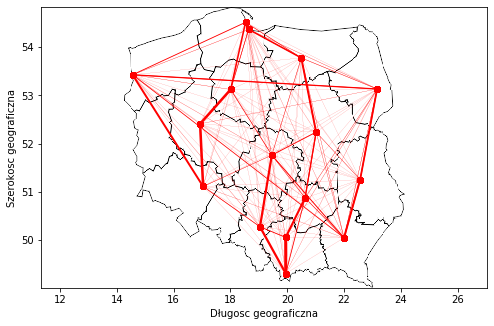

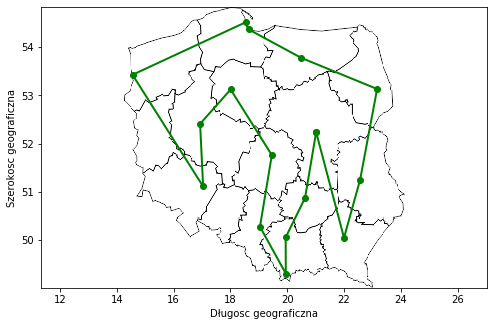

['Warszawa', 'Kielce', 'Krakow', 'Zakopane', 'Katowice', 'Lodz', 'Bydgoszcz', 'Poznan', 'Wroclaw', 'Szczecin', 'Gdynia', 'Gdansk', 'Olsztyn', 'Bialystok', 'Lublin', 'Rzeszow'] 28.823143513323874


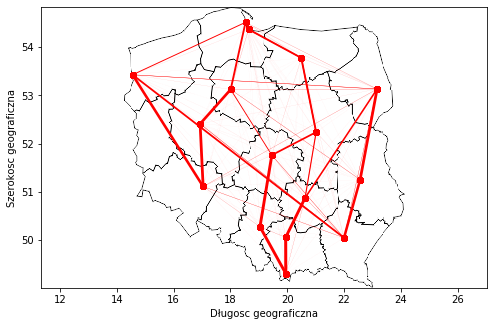

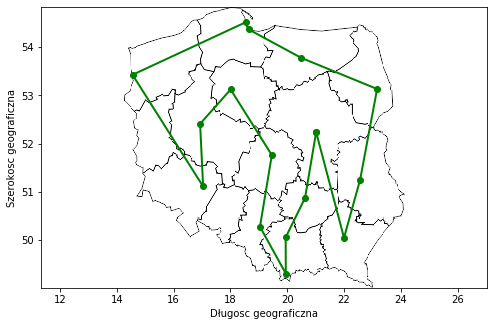

['Warszawa', 'Kielce', 'Krakow', 'Zakopane', 'Katowice', 'Lodz', 'Bydgoszcz', 'Poznan', 'Wroclaw', 'Szczecin', 'Gdynia', 'Gdansk', 'Olsztyn', 'Bialystok', 'Lublin', 'Rzeszow'] 28.823143513323874


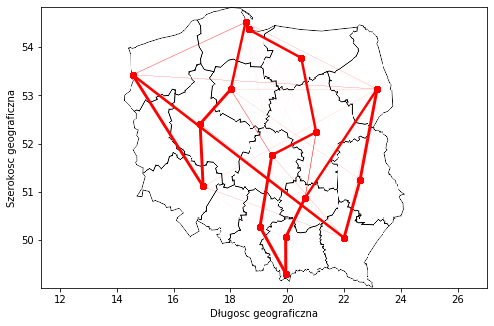

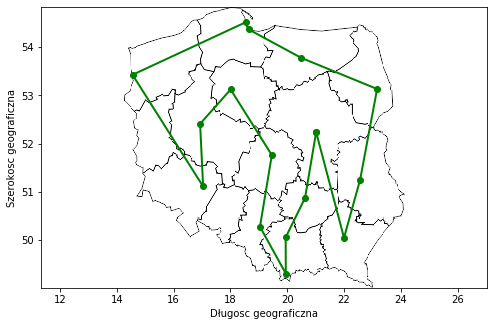

['Warszawa', 'Kielce', 'Krakow', 'Zakopane', 'Katowice', 'Lodz', 'Bydgoszcz', 'Poznan', 'Wroclaw', 'Szczecin', 'Gdynia', 'Gdansk', 'Olsztyn', 'Bialystok', 'Lublin', 'Rzeszow'] 28.823143513323874


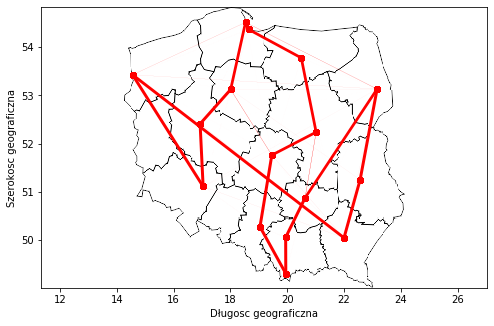

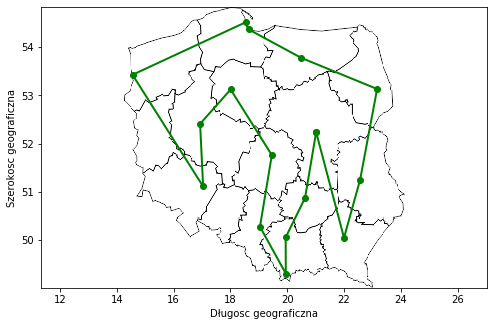

['Warszawa', 'Kielce', 'Krakow', 'Zakopane', 'Katowice', 'Lodz', 'Bydgoszcz', 'Poznan', 'Wroclaw', 'Szczecin', 'Gdynia', 'Gdansk', 'Olsztyn', 'Bialystok', 'Lublin', 'Rzeszow'] 28.823143513323874


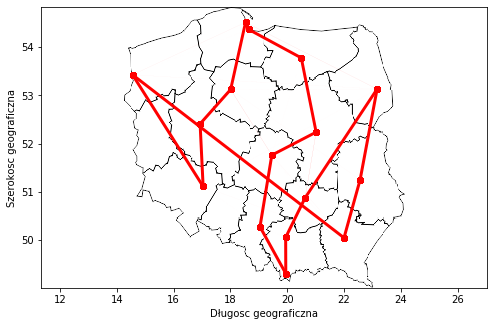

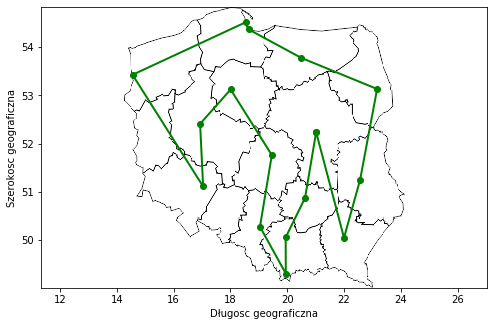

['Warszawa', 'Kielce', 'Krakow', 'Zakopane', 'Katowice', 'Lodz', 'Bydgoszcz', 'Poznan', 'Wroclaw', 'Szczecin', 'Gdynia', 'Gdansk', 'Olsztyn', 'Bialystok', 'Lublin', 'Rzeszow'] 28.823143513323874


(['Warszawa',
  'Kielce',
  'Krakow',
  'Zakopane',
  'Katowice',
  'Lodz',
  'Bydgoszcz',
  'Poznan',
  'Wroclaw',
  'Szczecin',
  'Gdynia',
  'Gdansk',
  'Olsztyn',
  'Bialystok',
  'Lublin',
  'Rzeszow'],
 28.823143513323874)

In [222]:
tsp = TSP()
tsp.solve(iterations = 10, ants = 100, alpha = 1, beta = 3, ro = 0.5, q = 10, display_period = 2)

In [223]:
class TSPrand(TSP):
    def __init__(self):
        self.cities.extend([str(i) for i in range(30)])
        for c in self.cities:
            self.coords[c] = (random.random()*100, random.random()*100)

        id = 0
        for c1 in self.cities:
            for c2 in self.cities:
                self.name_to_id[c1+"-"+c2] = id
                self.parts_phero.append(1)
                self.parts_phero_delta.append(0)
                self.distance.append(self.dist(self.coords[c1][0], self.coords[c1][1],
                                               self.coords[c2][0], self.coords[c2][1]))
                id += 1
                
    def display_pheromones(self):
        self.display_pheromones_param(False, [0, 100], [0, 100])
        
    def display_solution(self, solution):
        self.display_solution_param(solution, False, [0, 100], [0, 100])

**Task 3:**

- How do the parameters influence the behavior of the algorithm?
- How does the heuristic knowledge influence the behavior of the algorithm? Is it necessary?
- Which parameters influence the convergence speed in ACO?
- Which parts of the solution are the first to be determined by ACO?
- How would you describe the behavior of the algorithm? How does it construct new, better solutions?


- What are the strengths of ACO?
- What are its weaknesses?
- How would you modify the ACO algorithm?
- For solving which problems is ACO best suited?


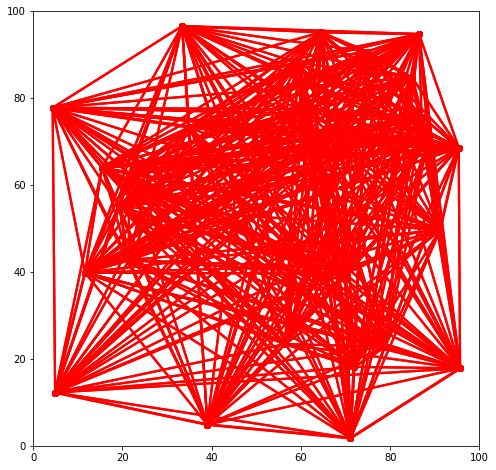

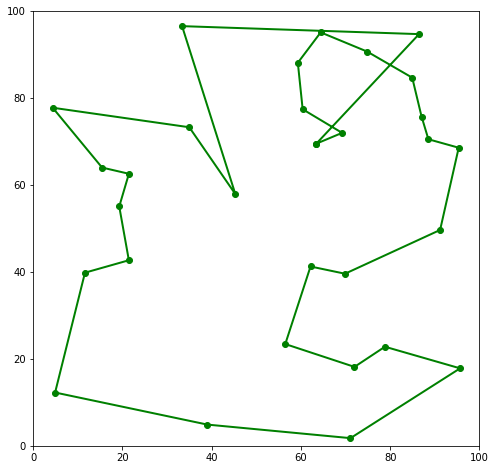

['1', '7', '24', '19', '28', '13', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '26', '3'] 548.8879865939167


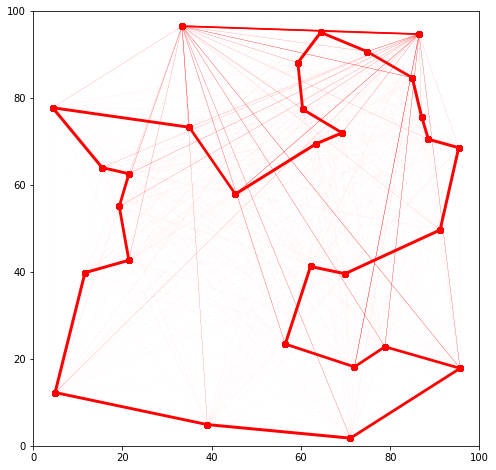

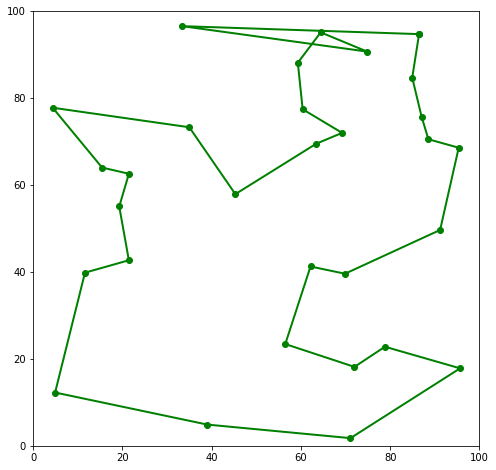

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


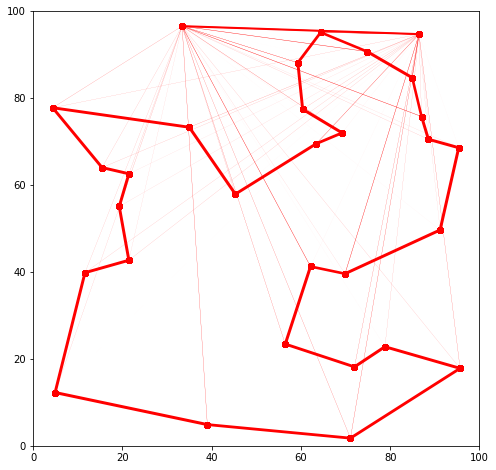

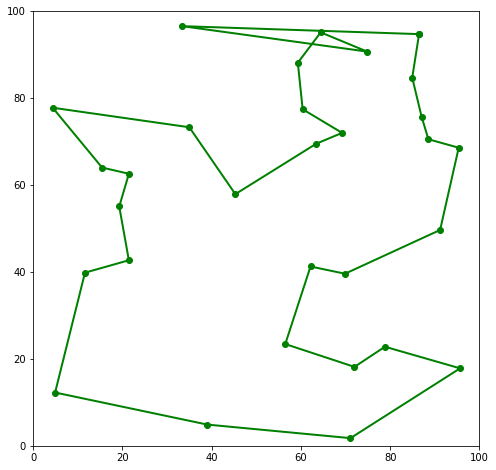

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


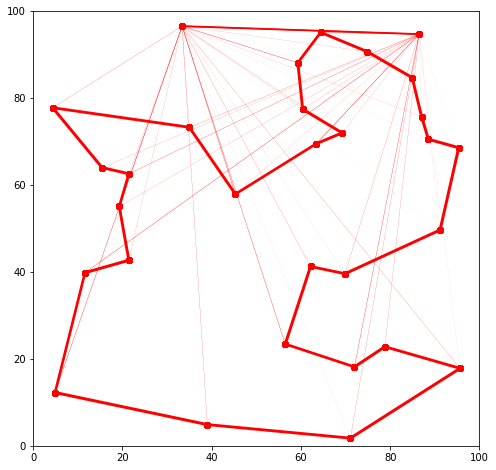

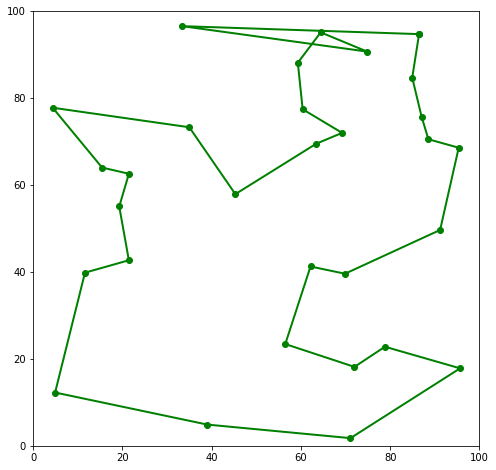

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


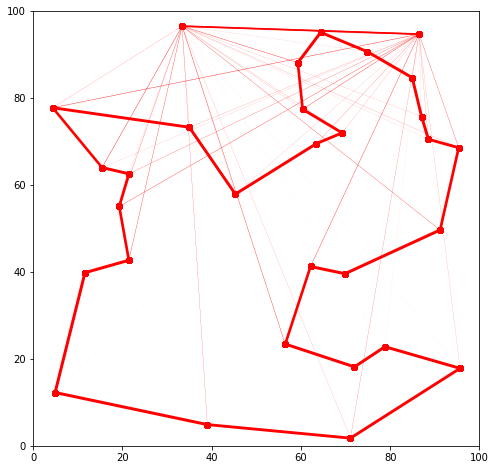

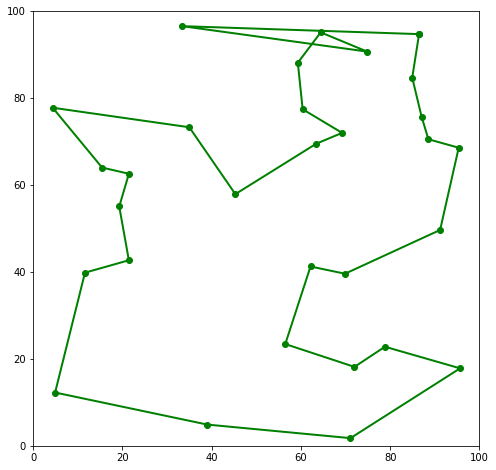

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


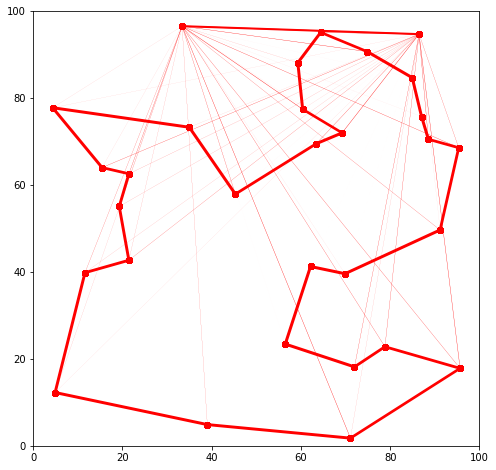

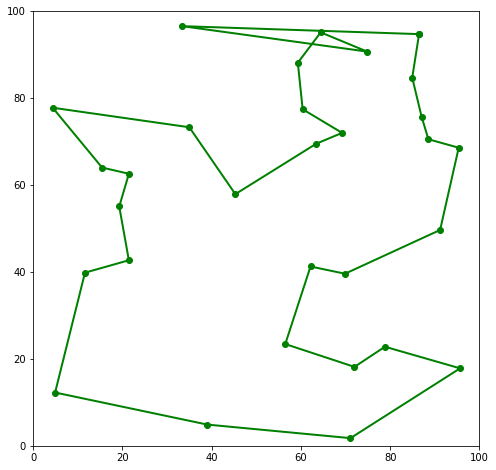

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


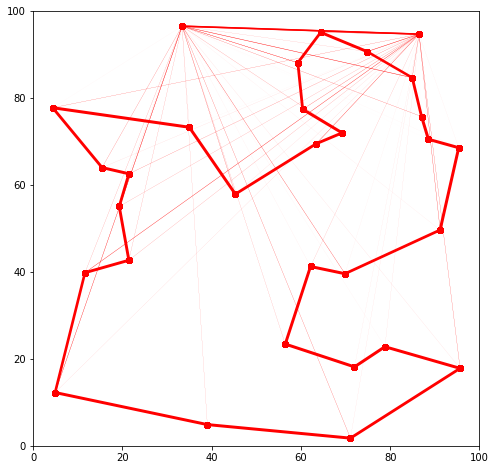

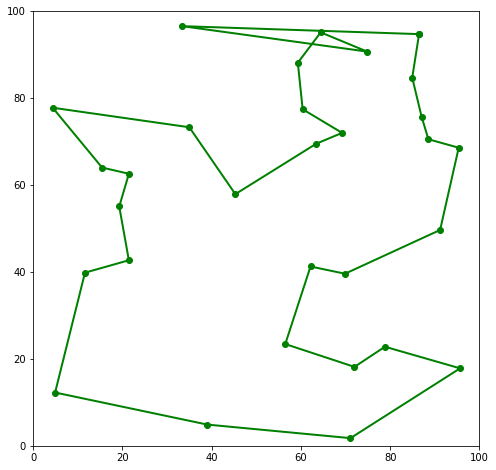

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


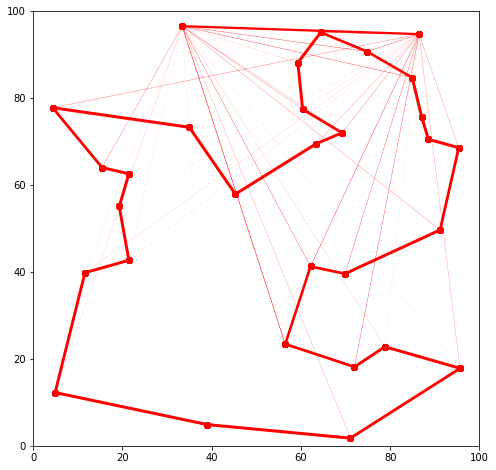

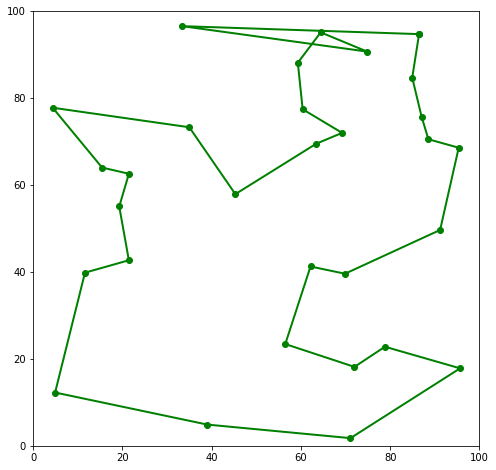

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


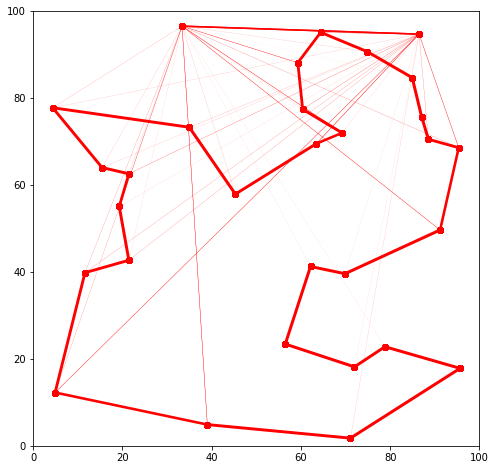

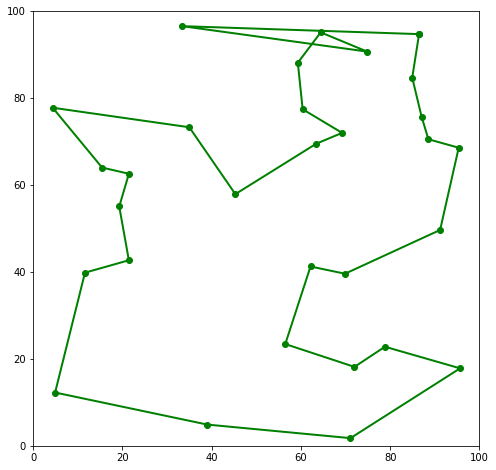

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


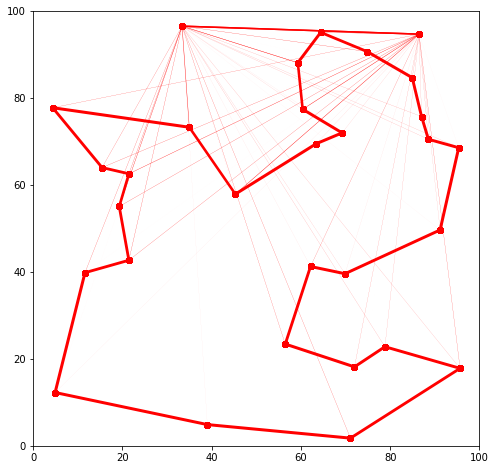

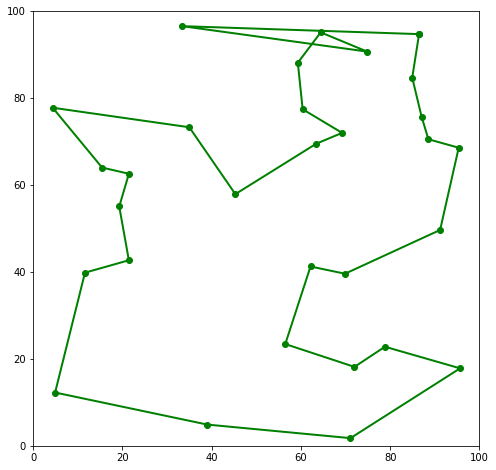

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


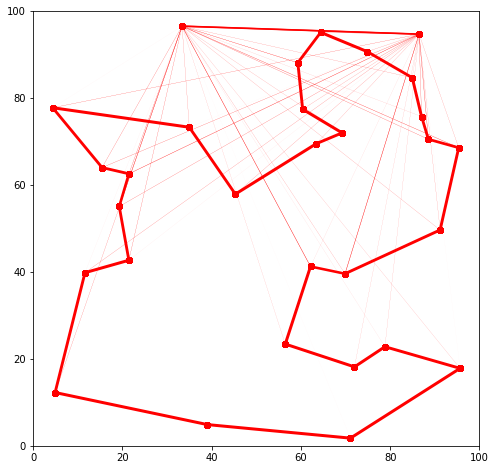

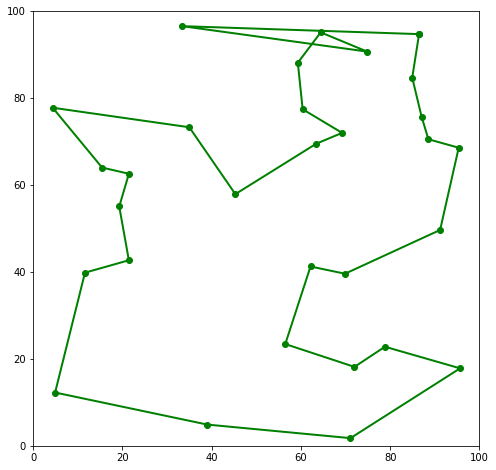

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


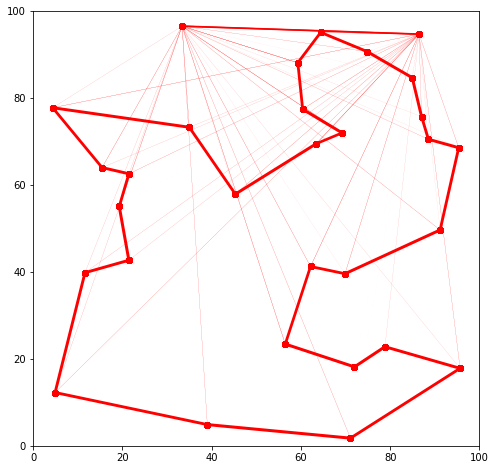

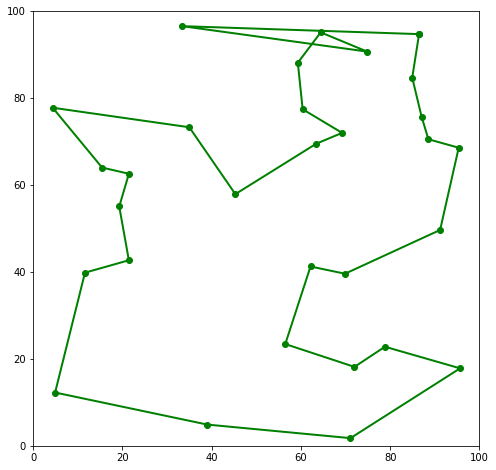

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


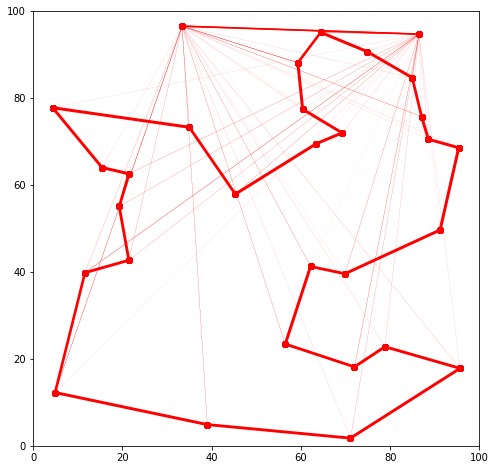

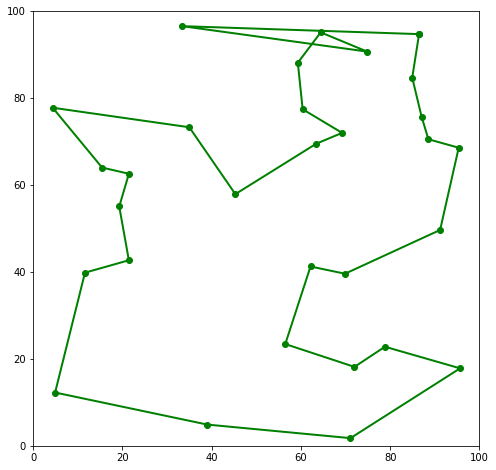

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


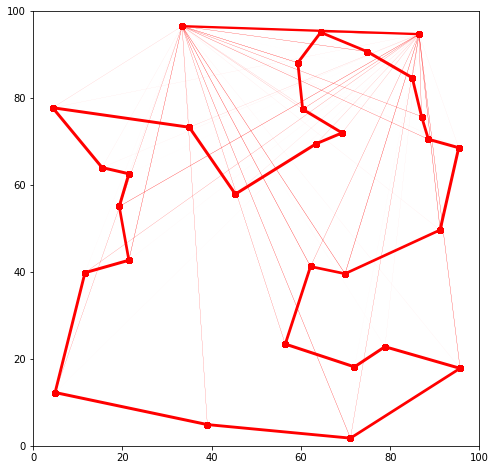

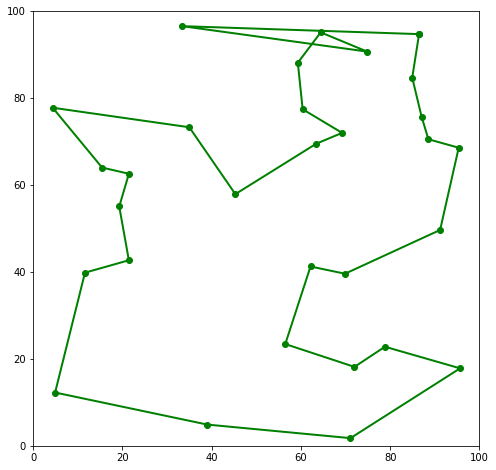

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


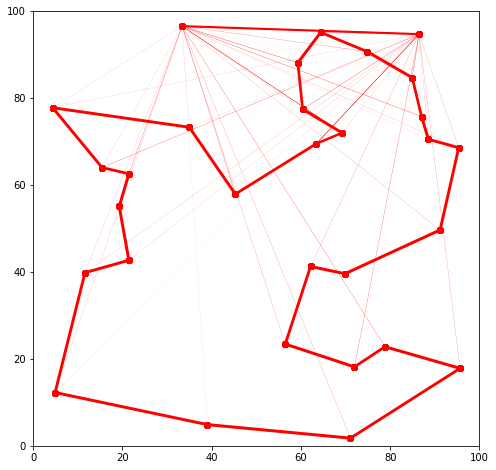

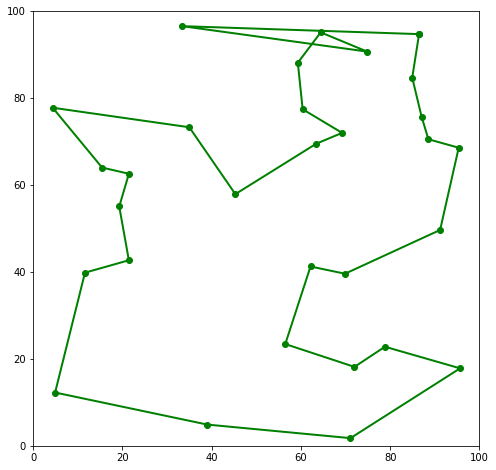

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


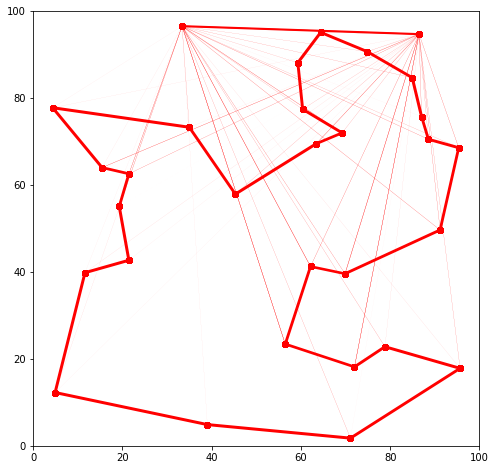

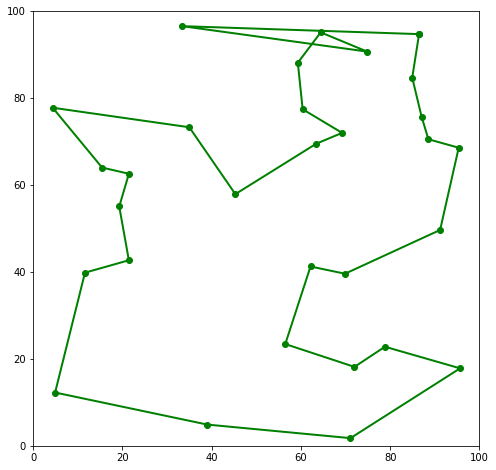

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


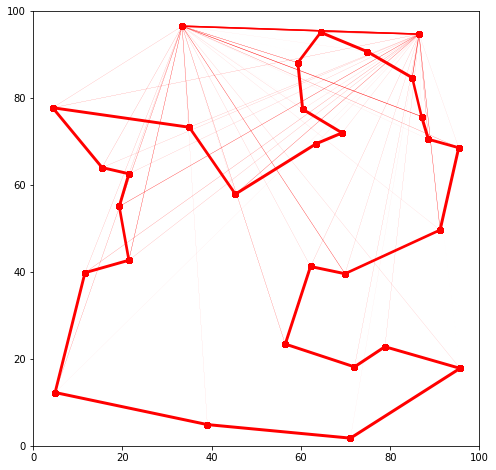

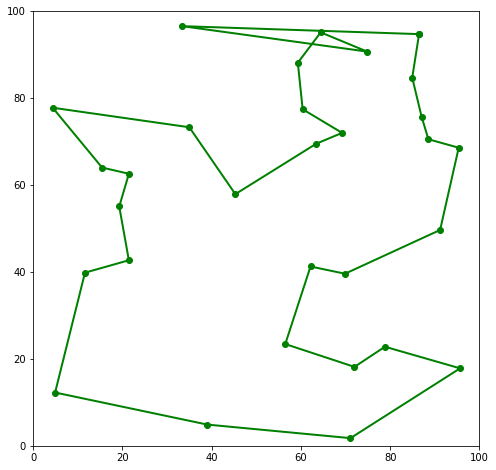

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


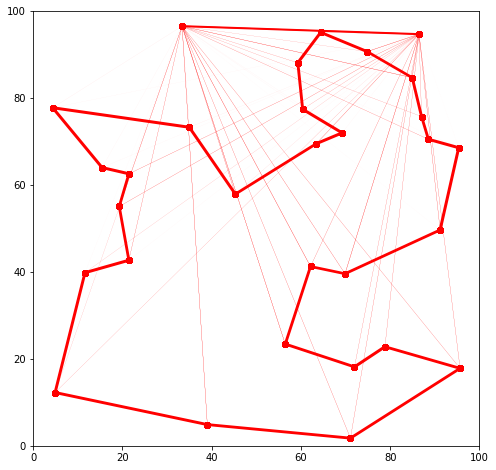

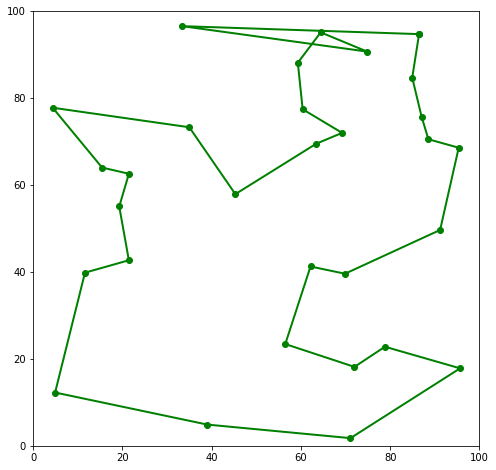

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


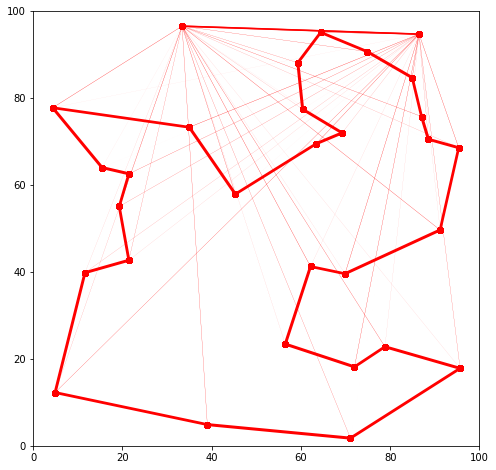

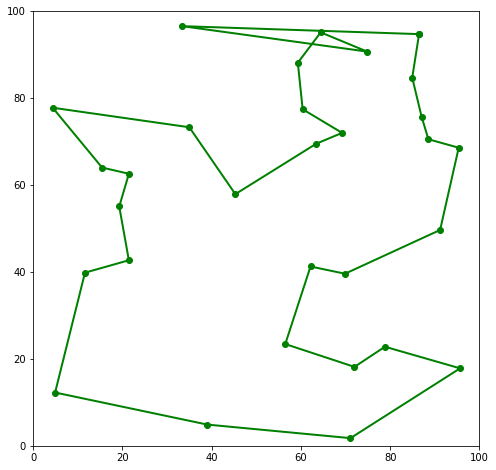

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


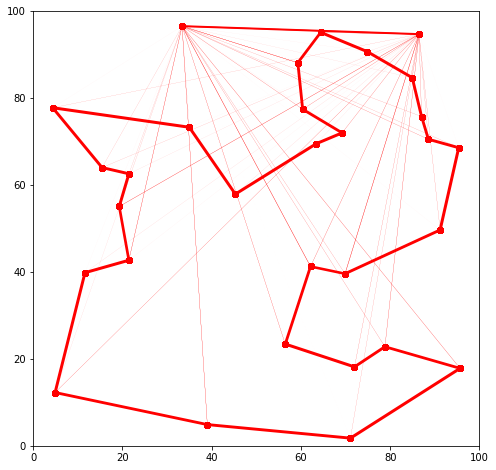

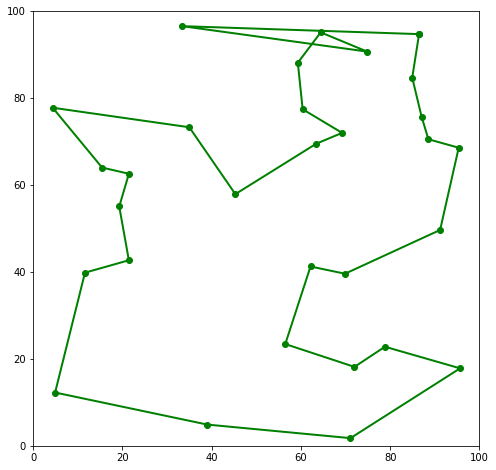

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


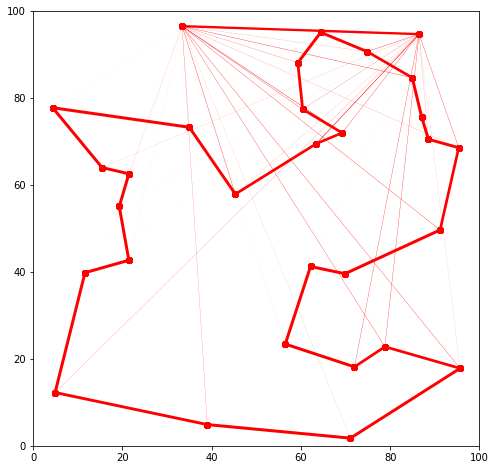

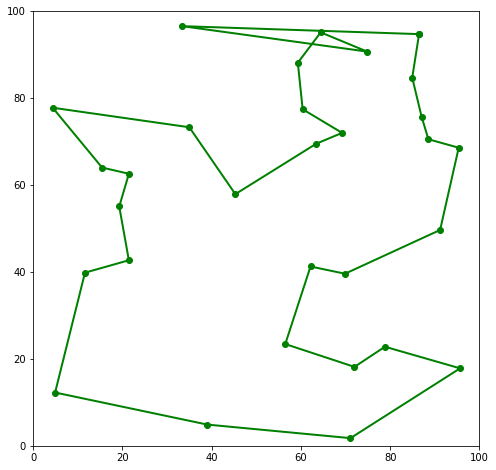

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


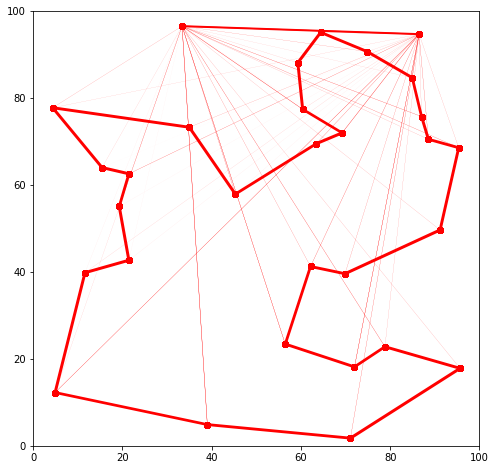

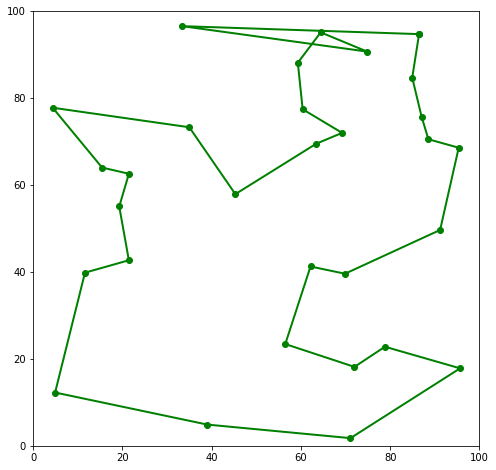

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


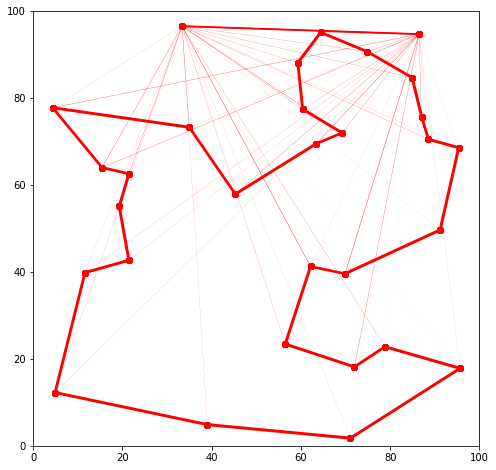

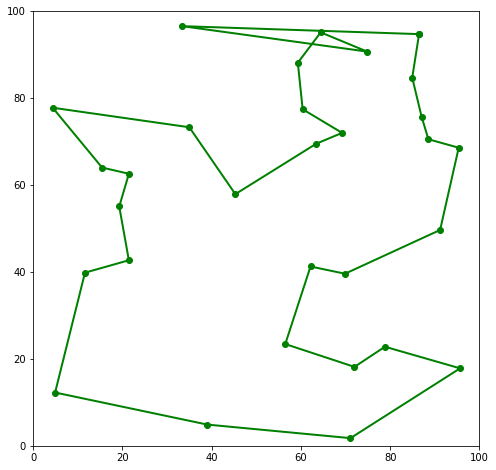

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


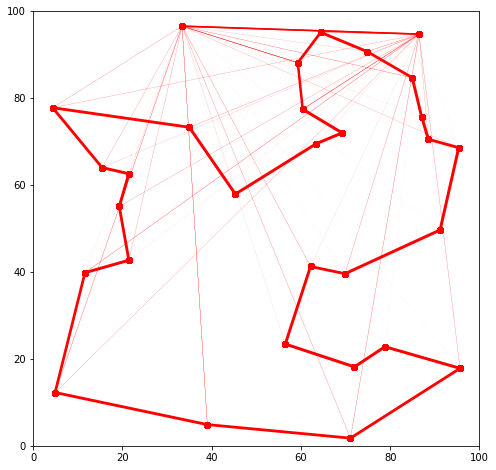

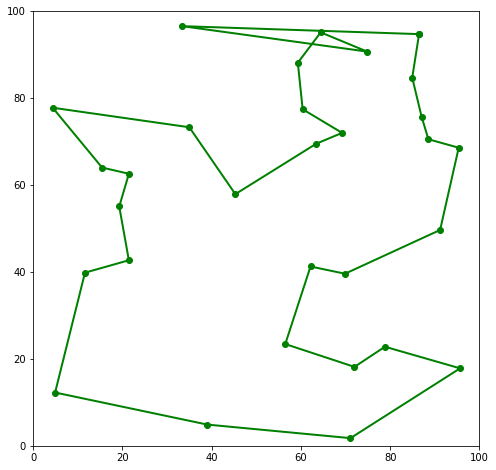

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


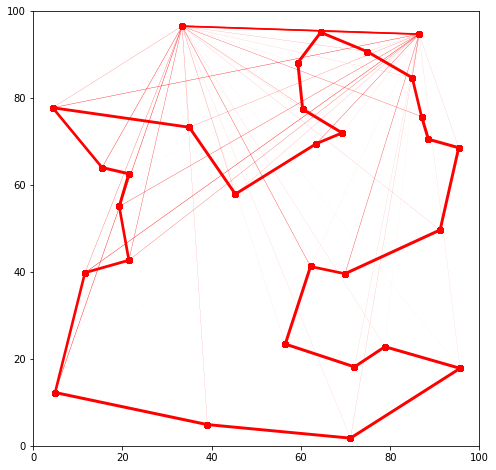

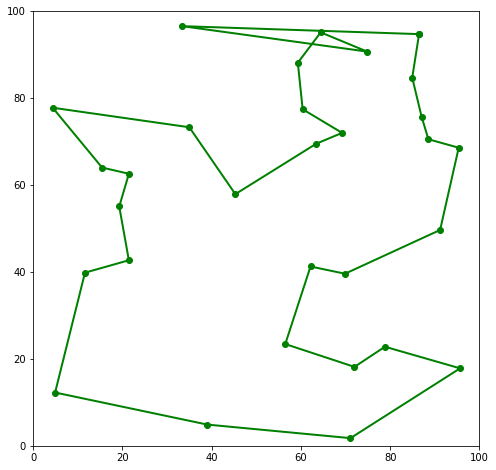

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


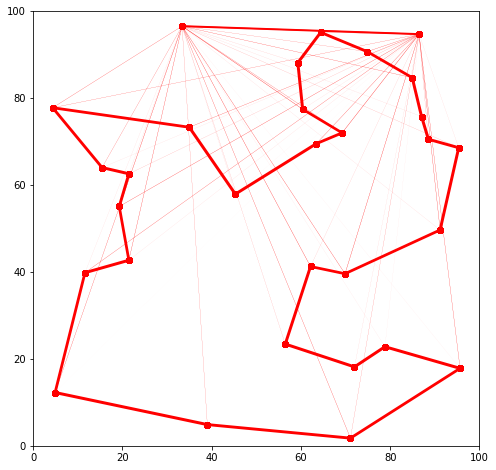

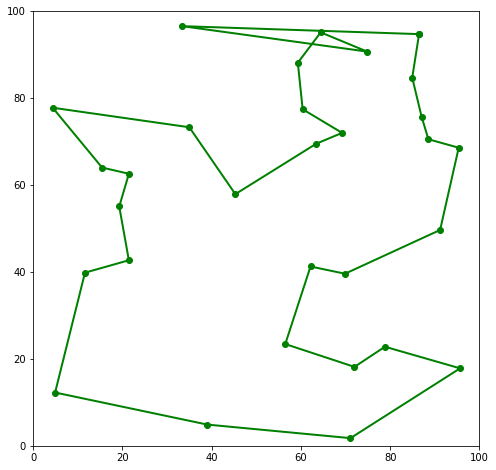

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


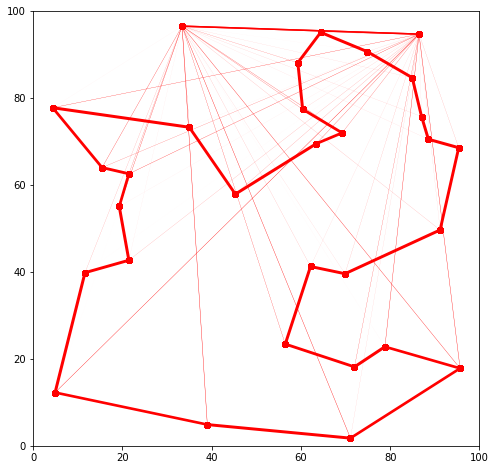

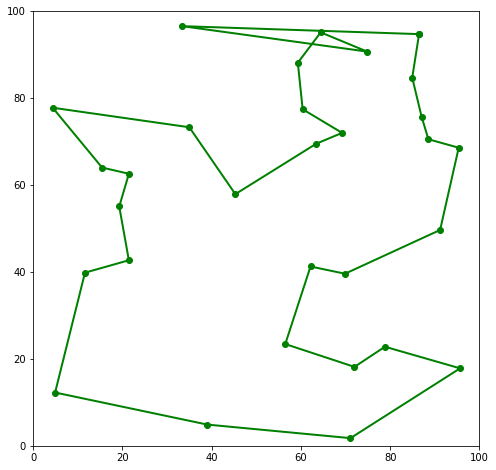

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


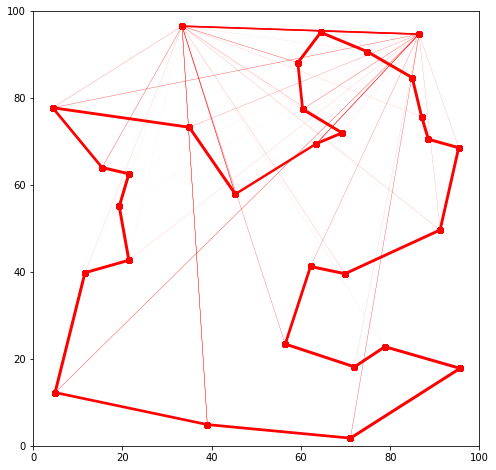

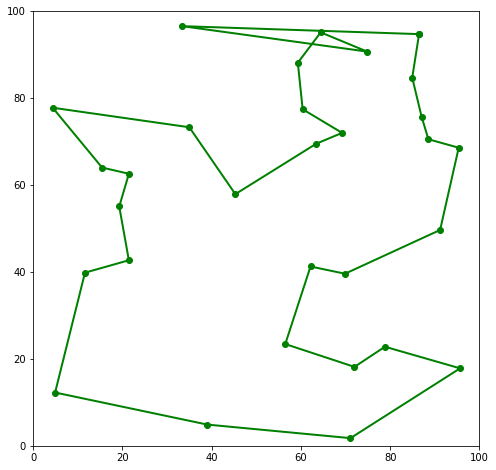

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


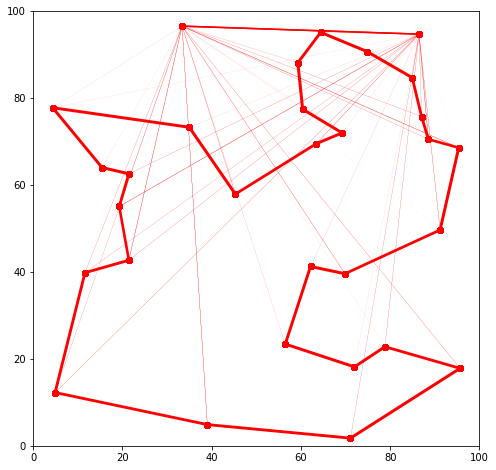

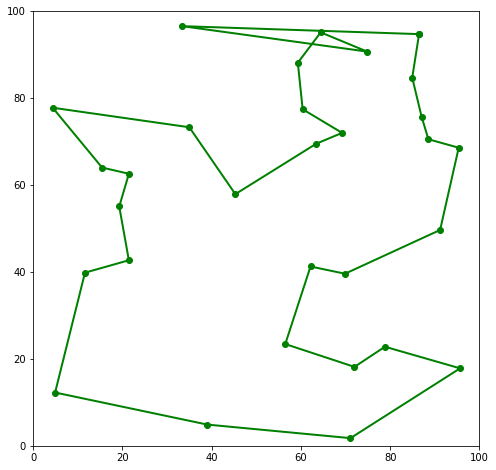

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


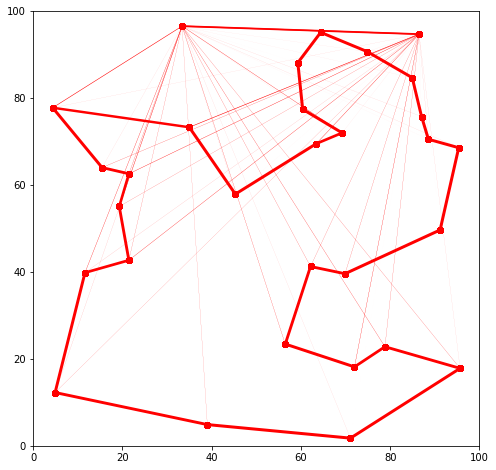

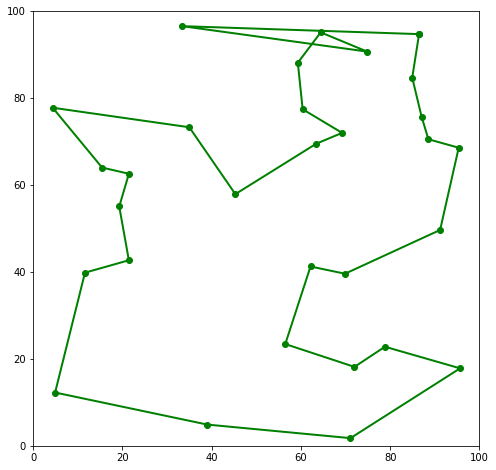

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


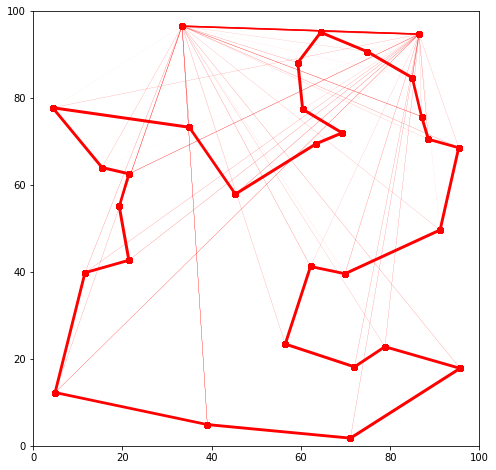

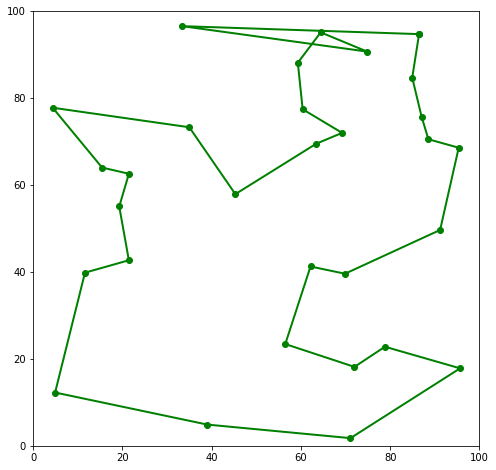

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


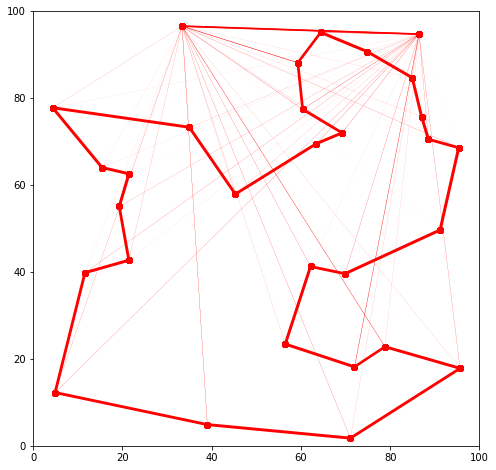

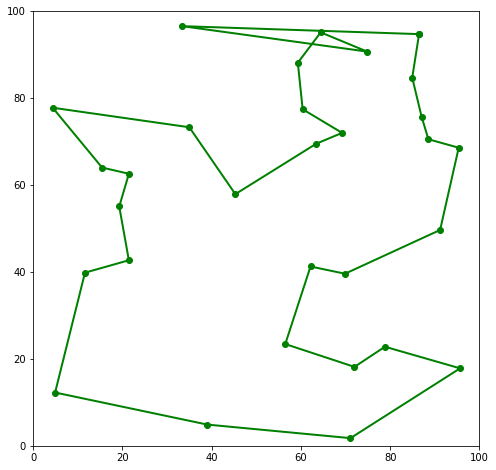

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


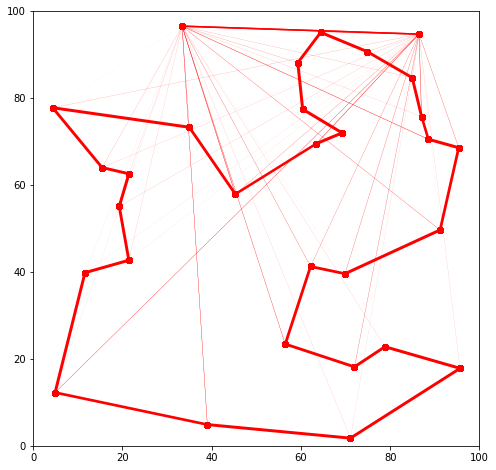

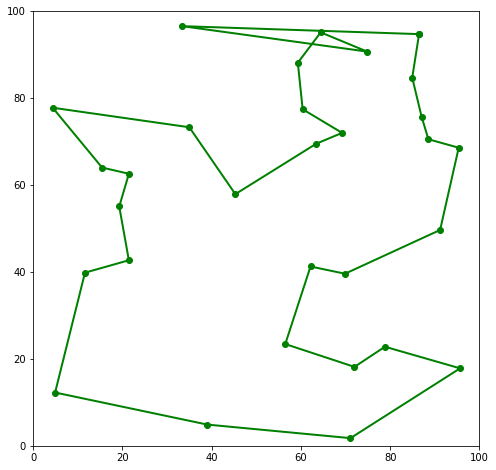

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


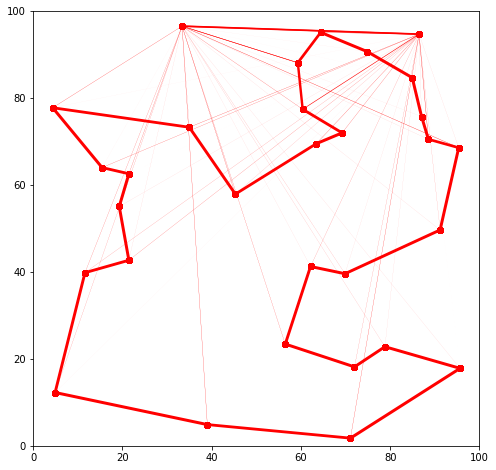

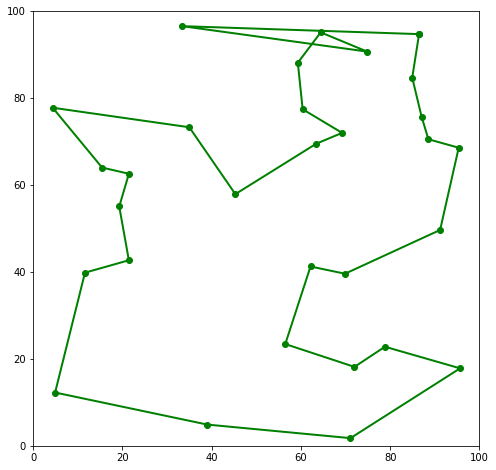

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


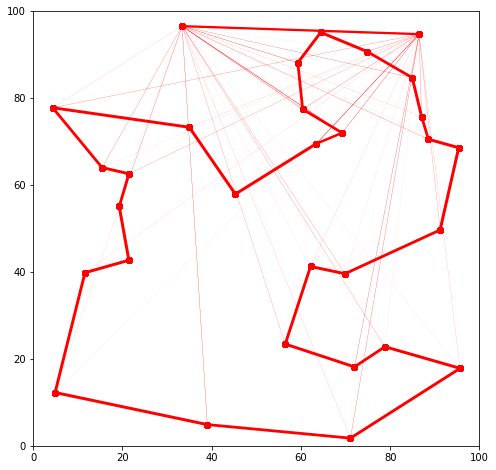

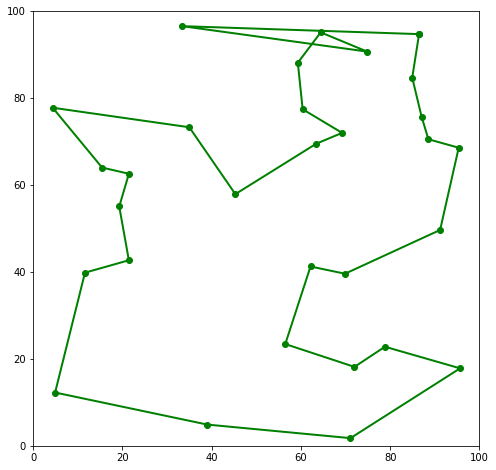

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


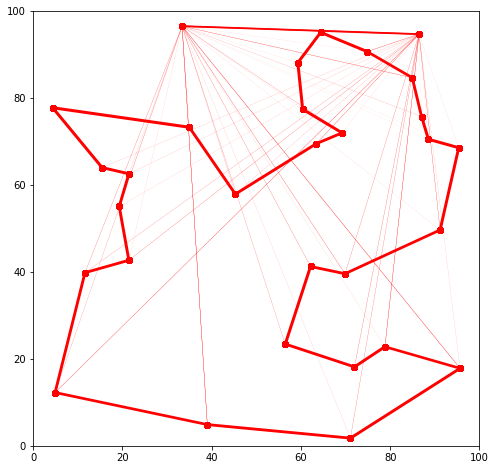

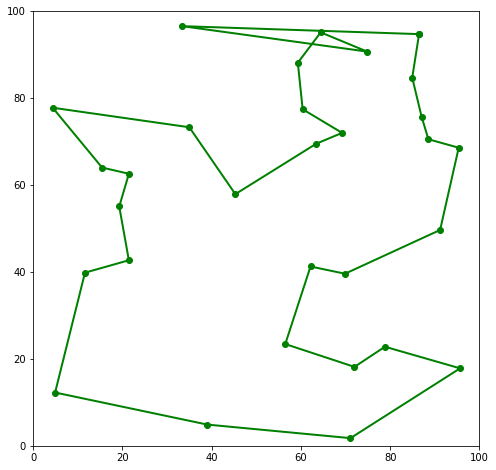

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


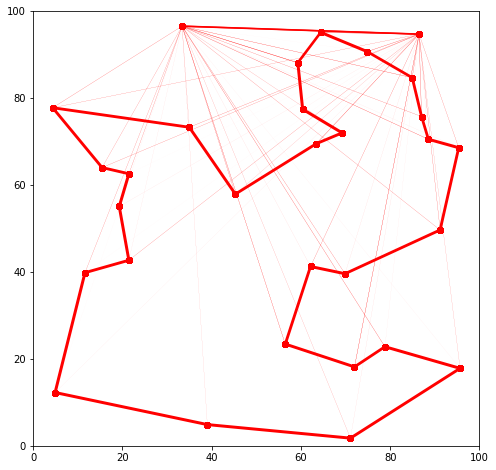

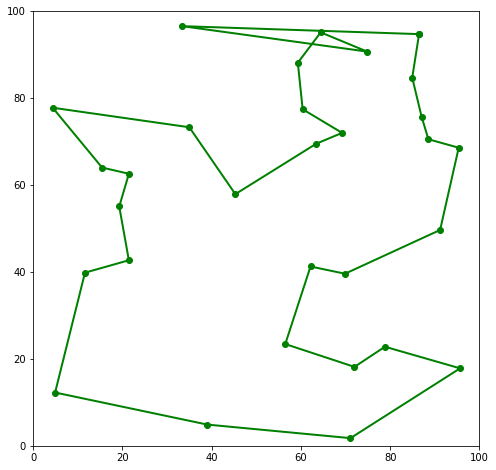

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


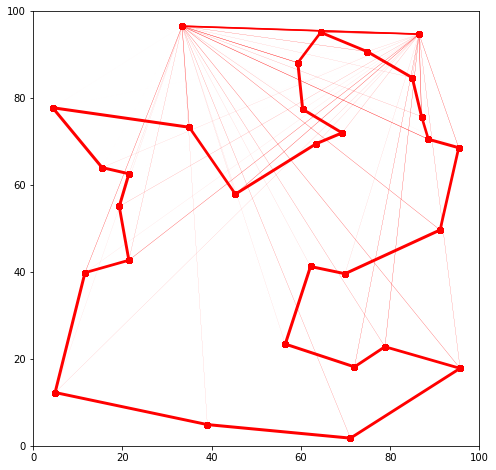

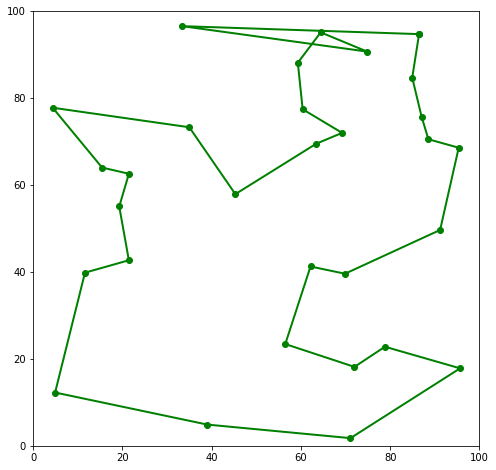

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


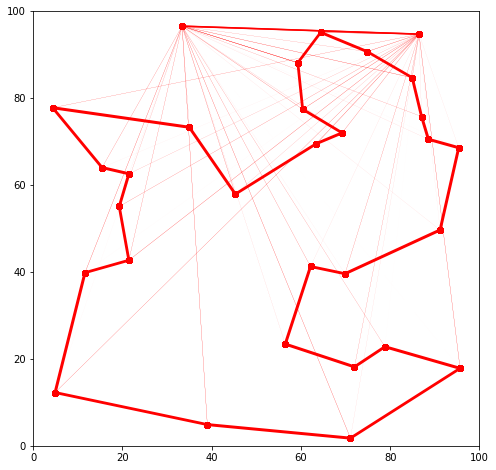

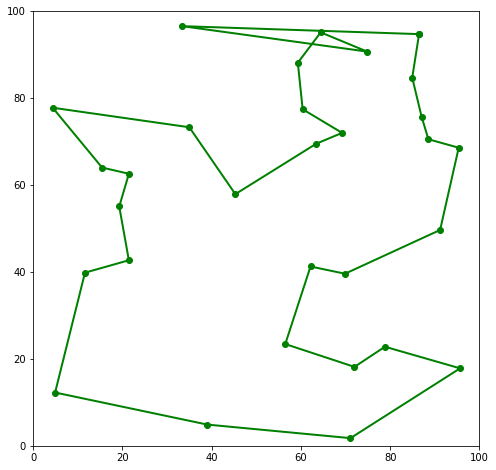

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


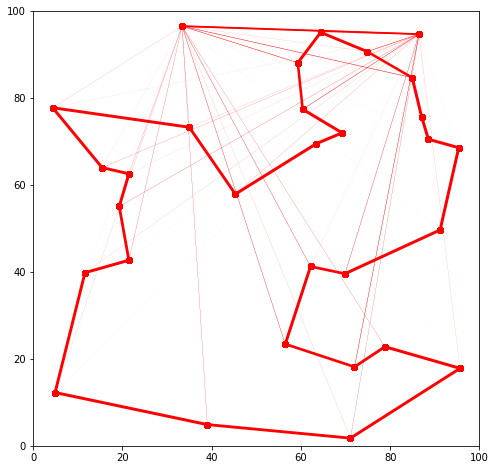

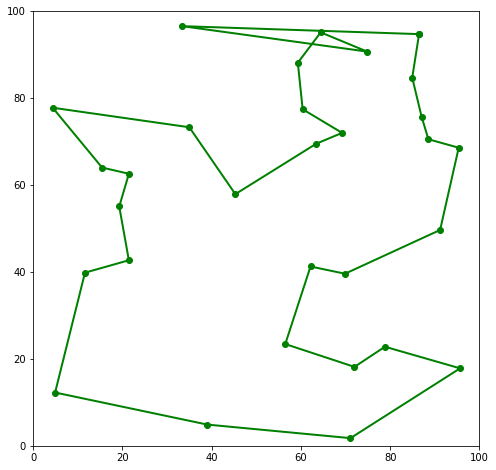

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


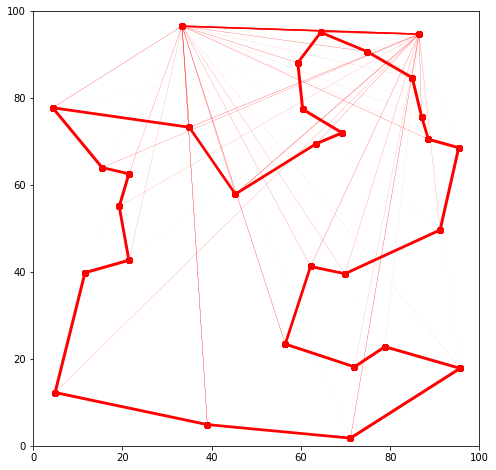

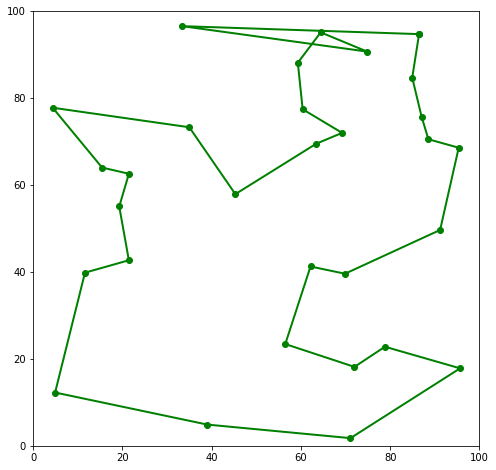

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


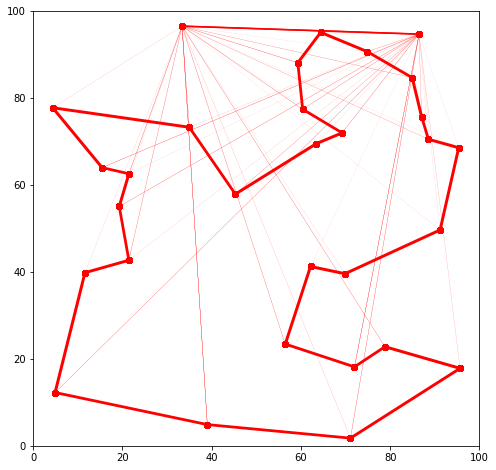

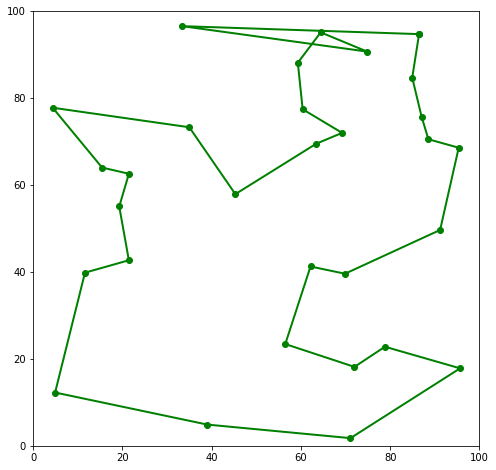

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


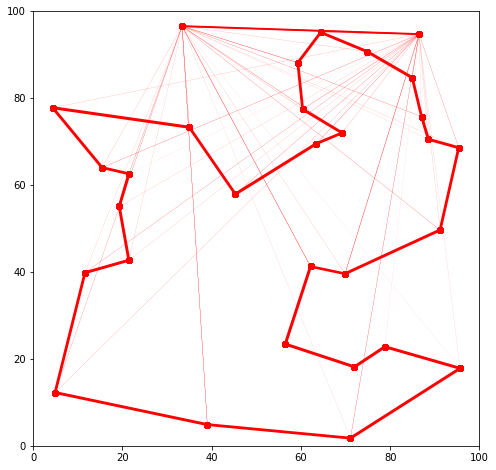

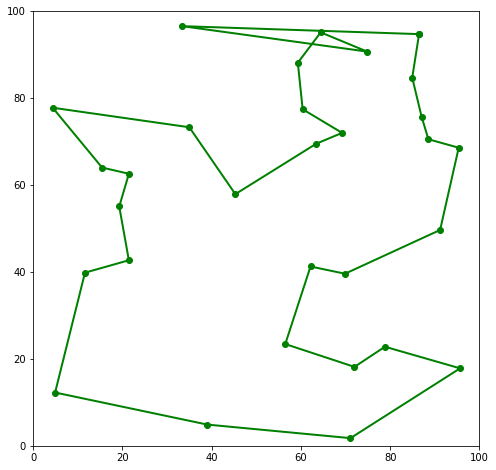

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


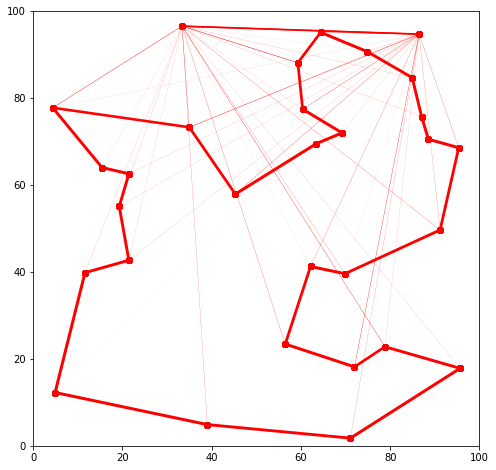

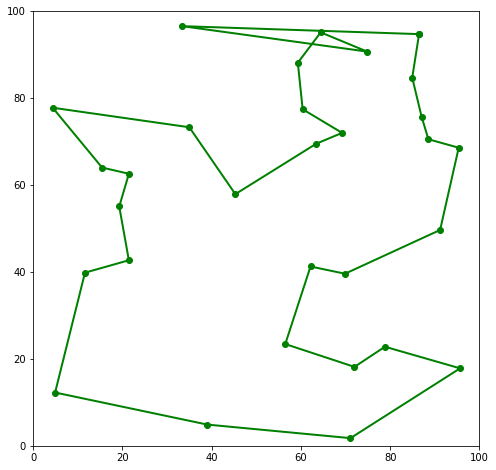

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


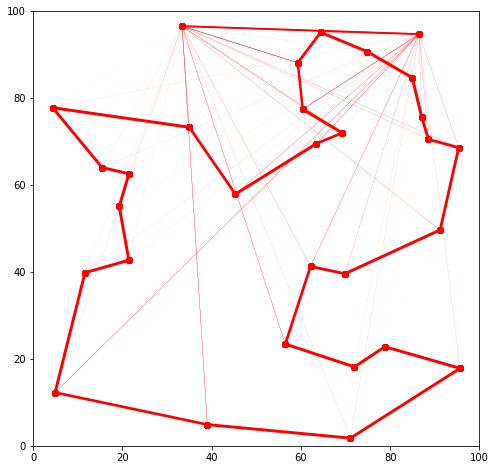

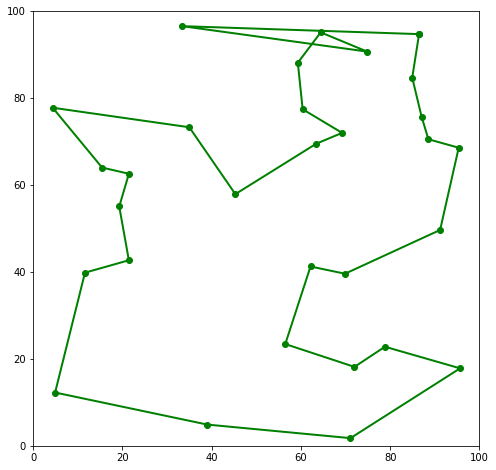

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


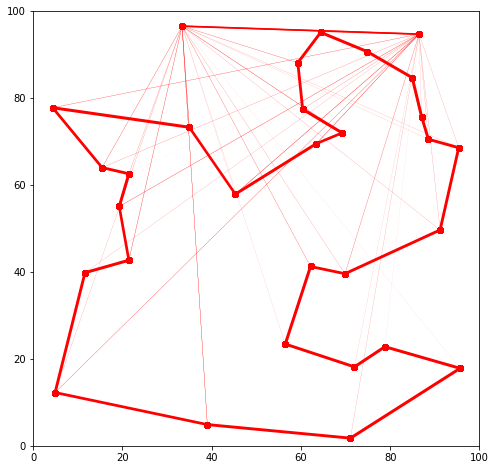

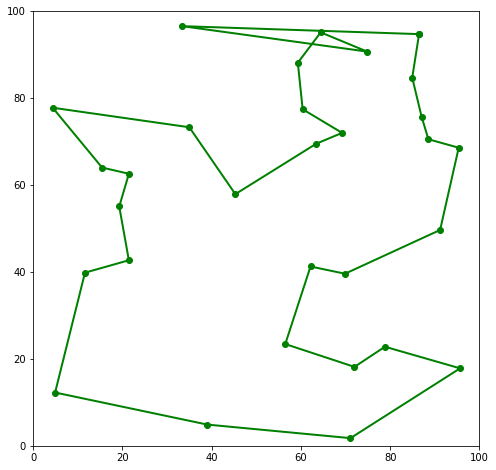

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


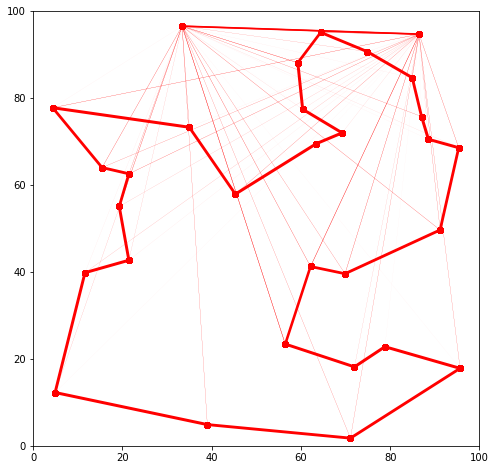

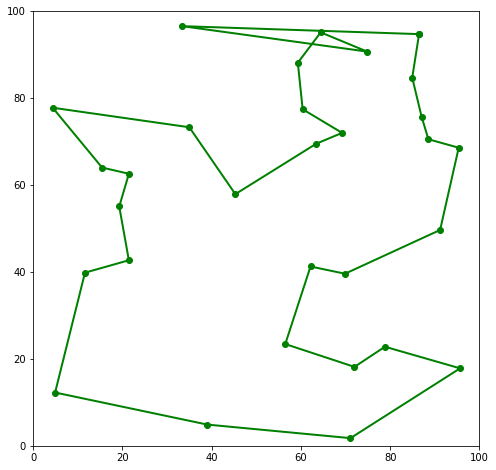

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


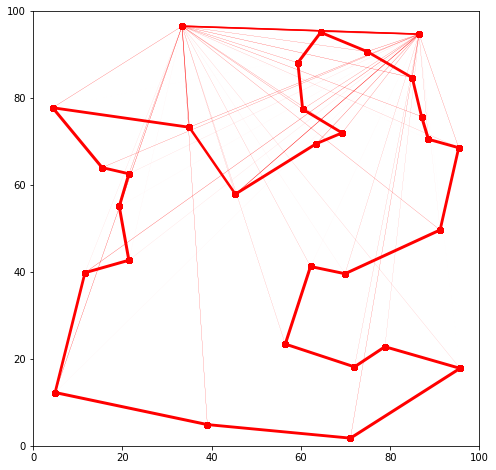

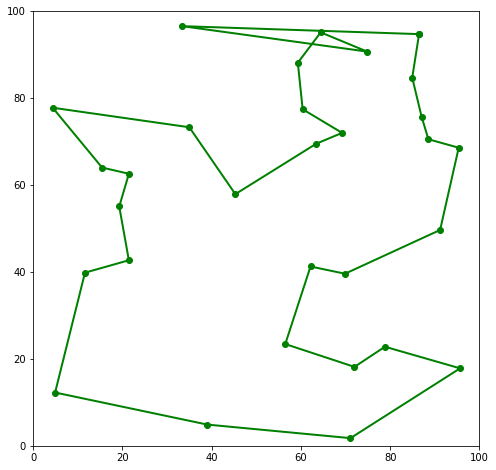

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


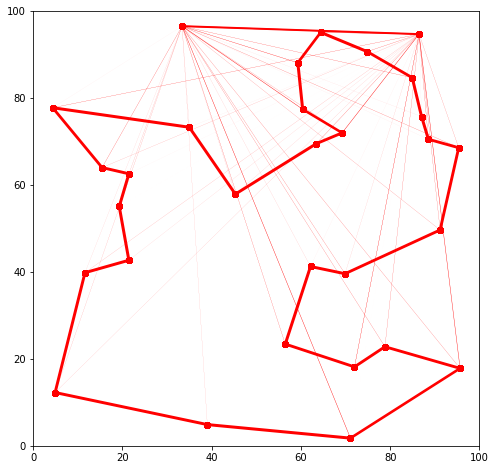

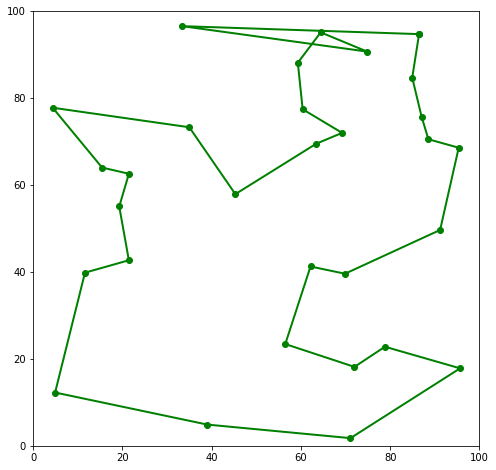

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


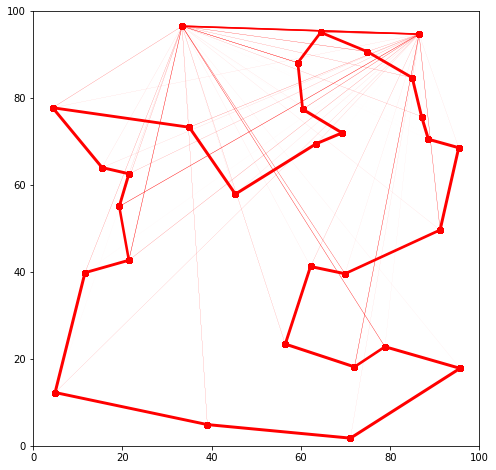

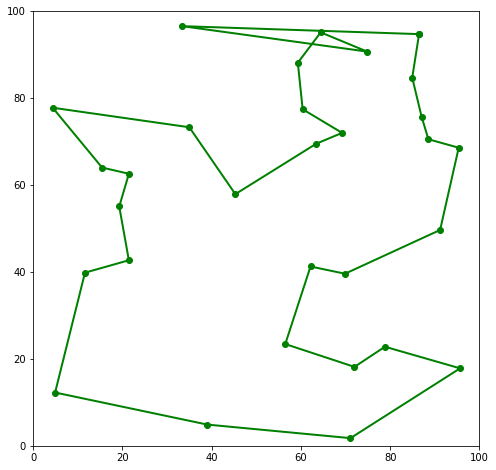

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


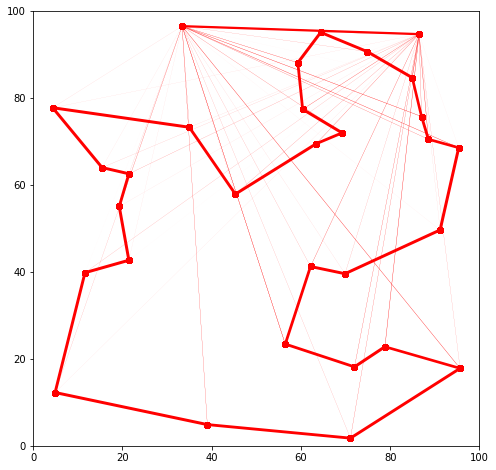

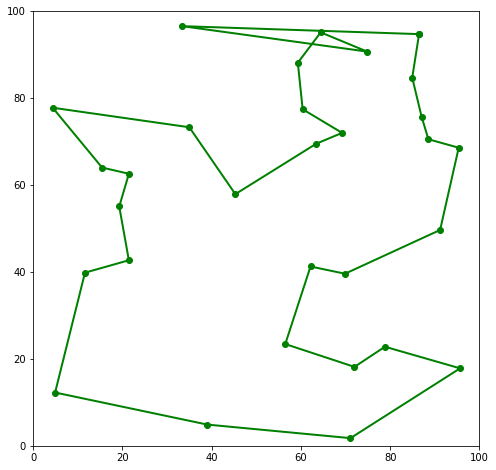

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


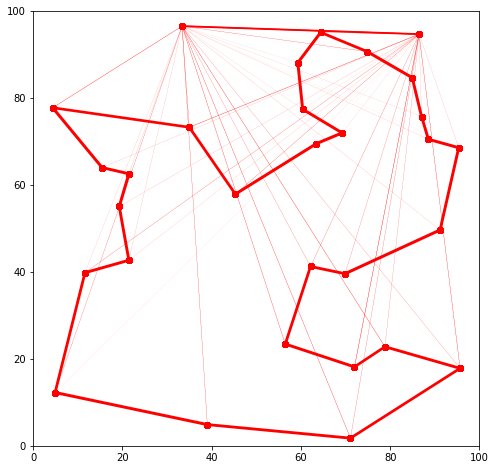

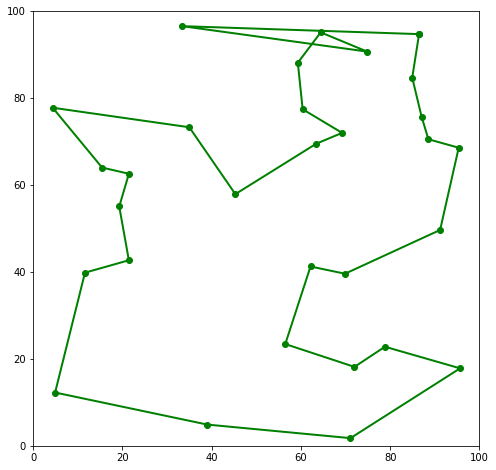

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


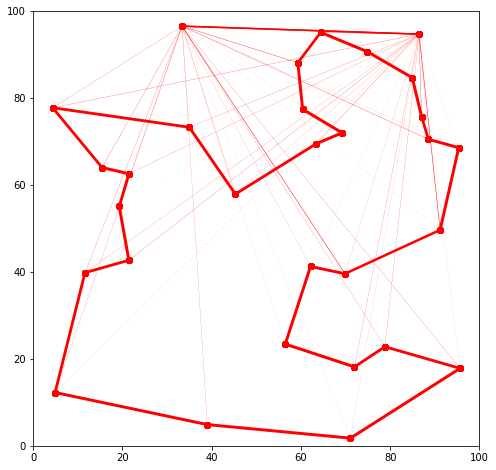

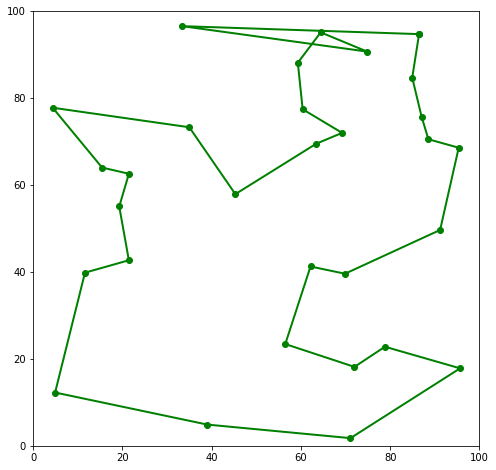

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


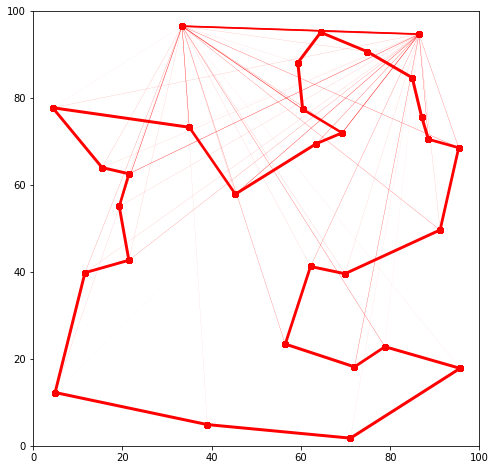

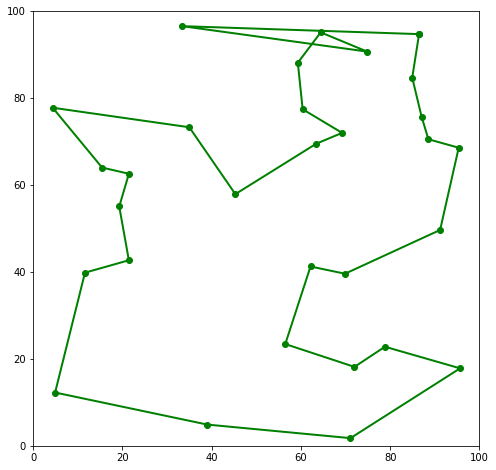

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


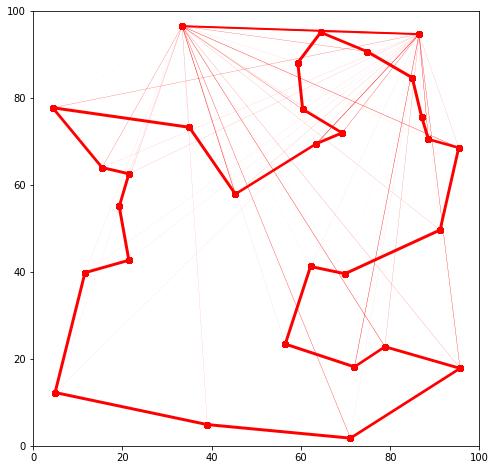

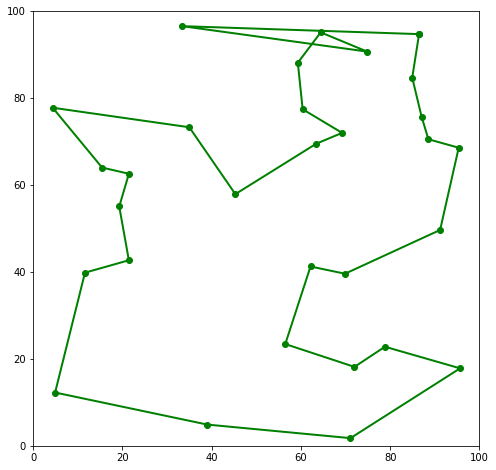

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


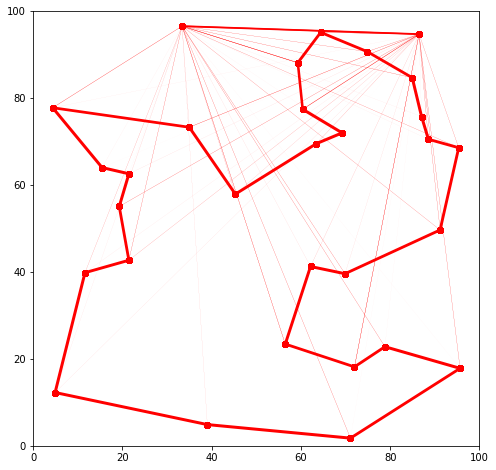

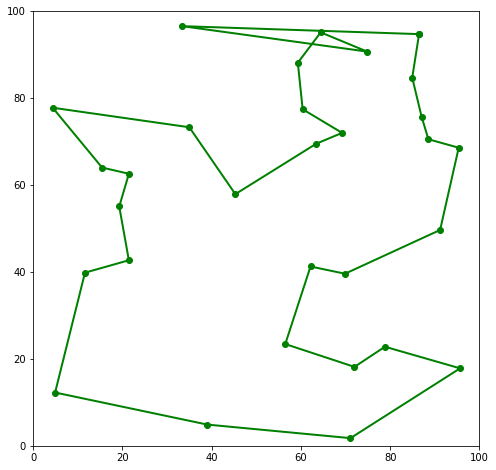

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


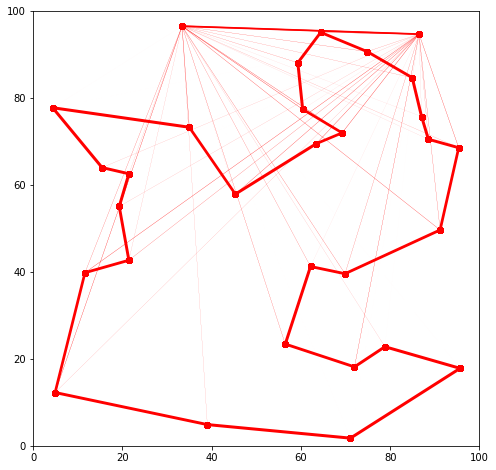

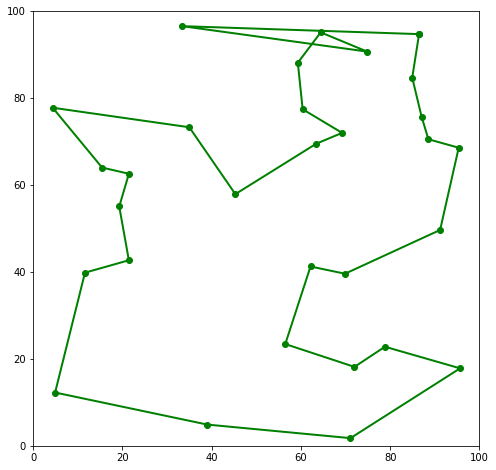

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


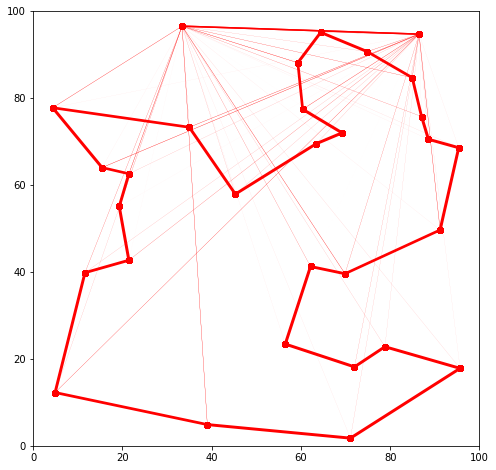

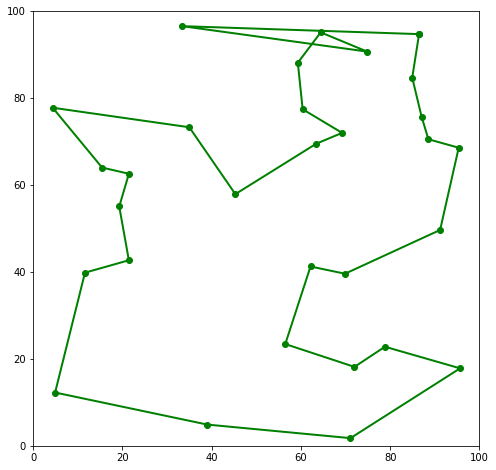

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


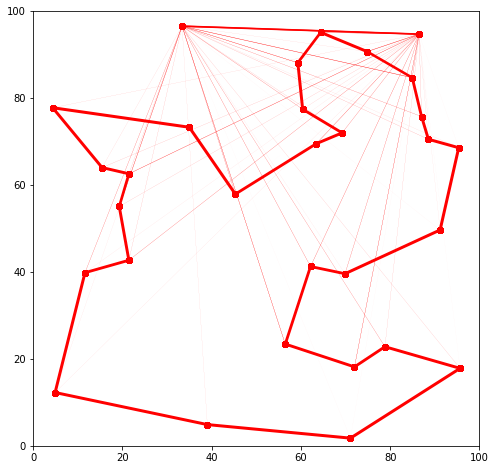

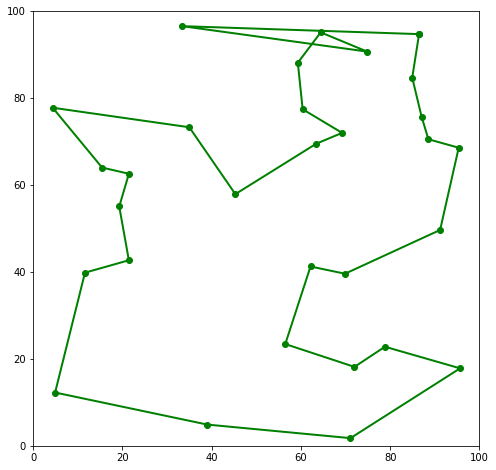

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


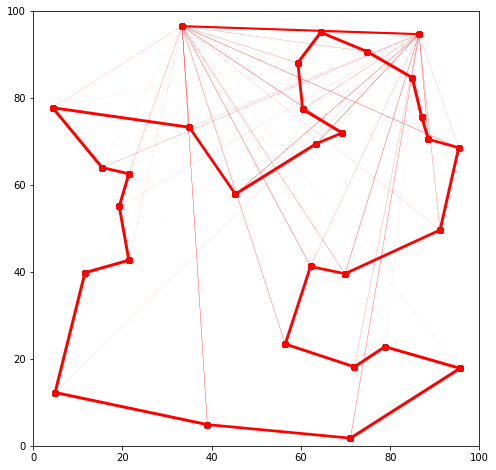

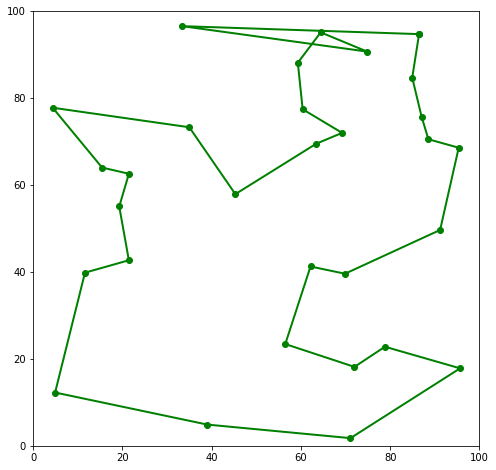

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


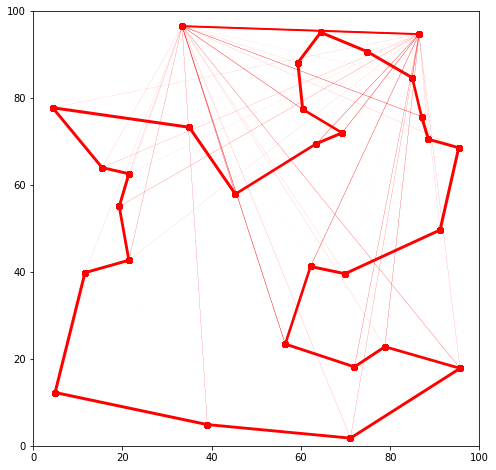

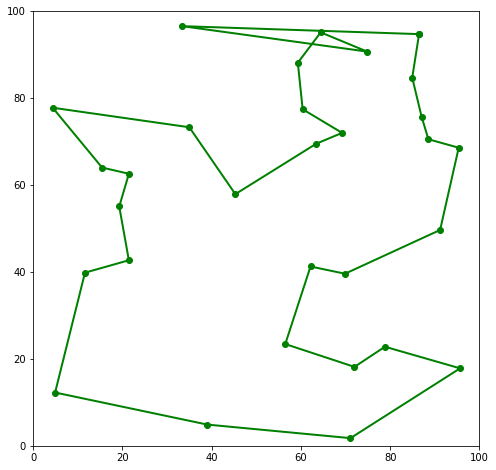

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


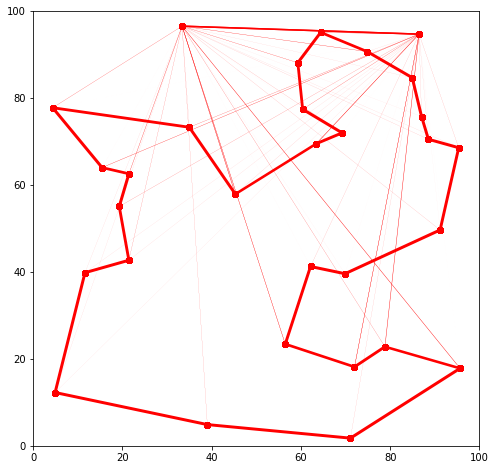

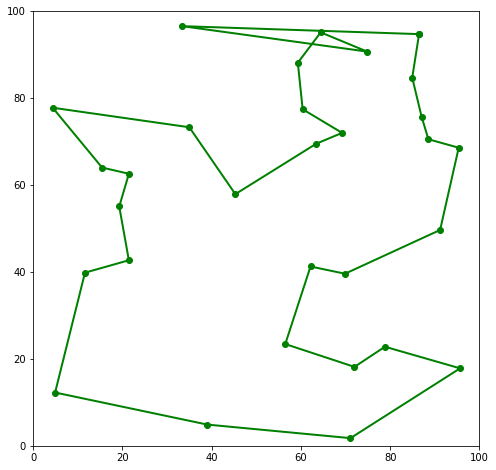

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


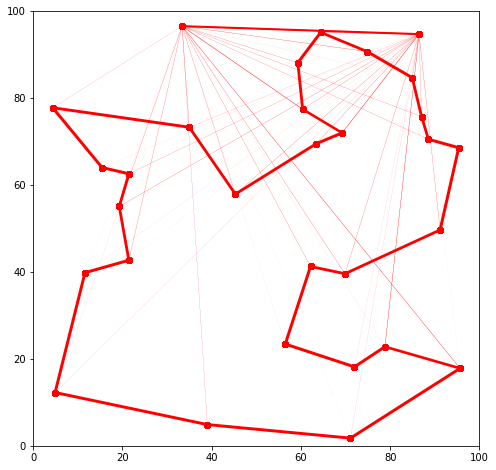

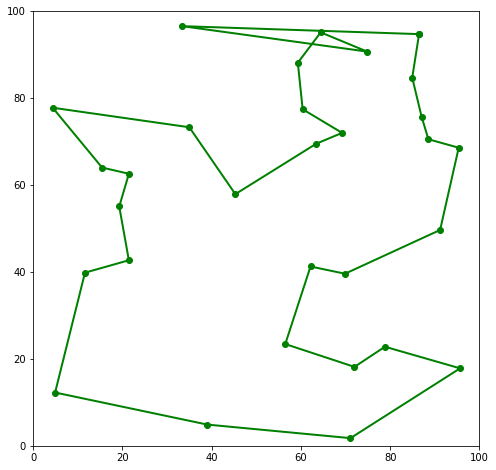

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


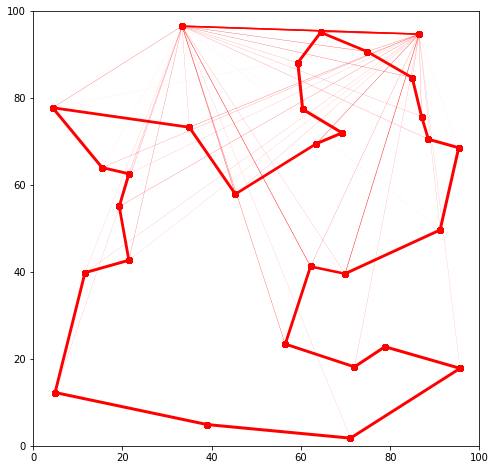

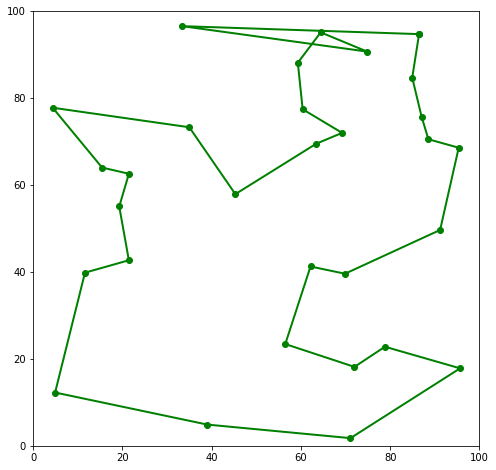

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


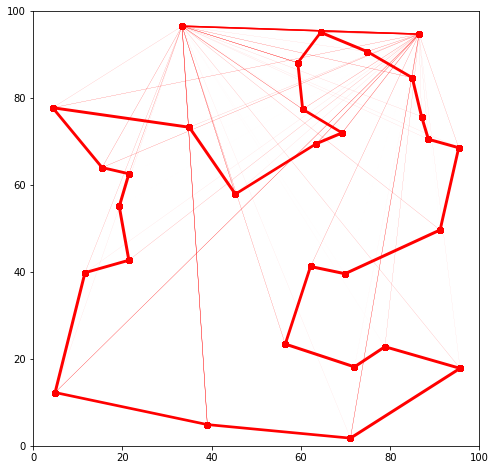

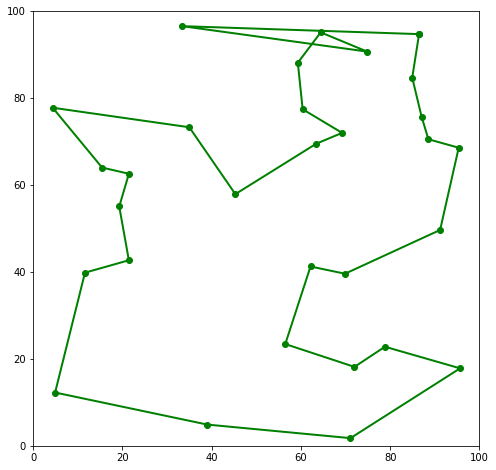

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


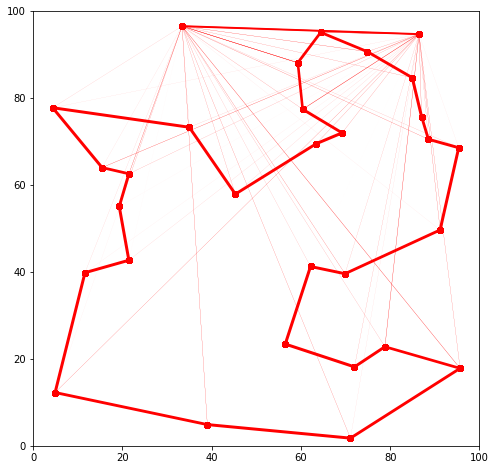

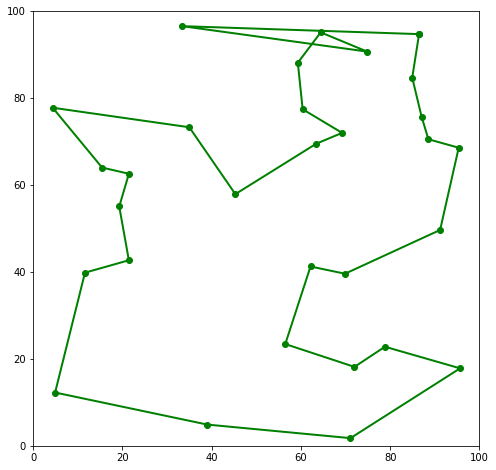

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


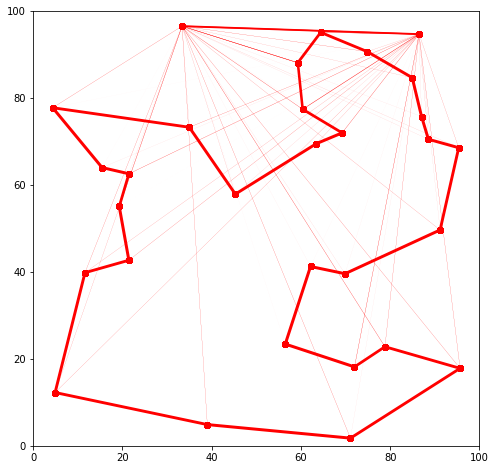

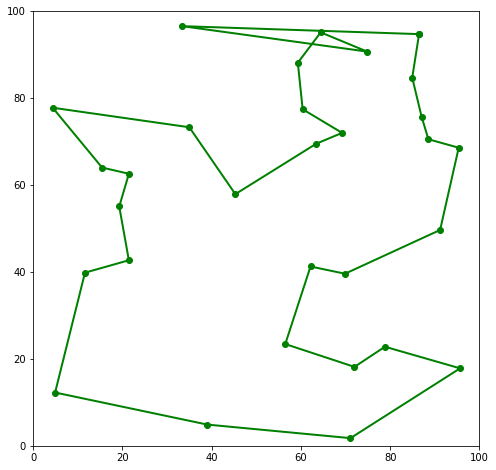

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


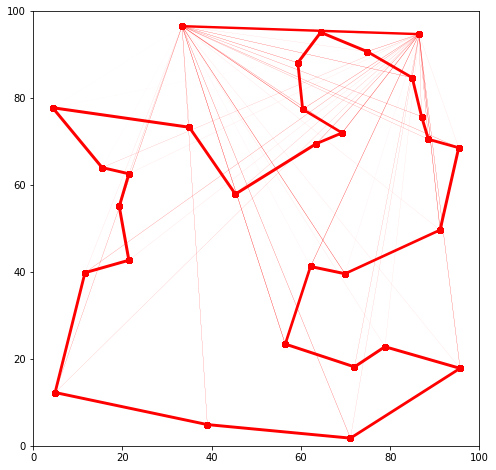

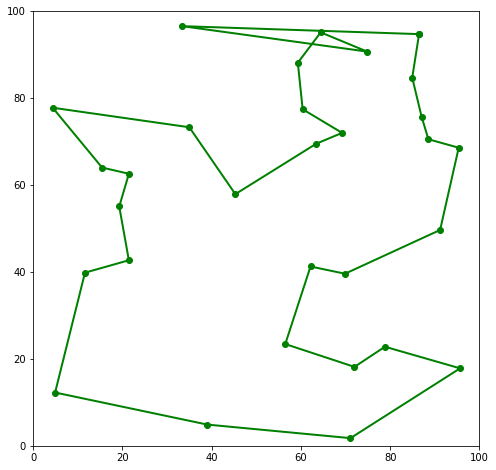

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


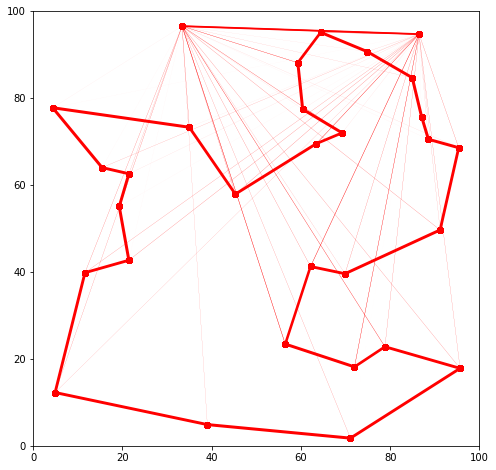

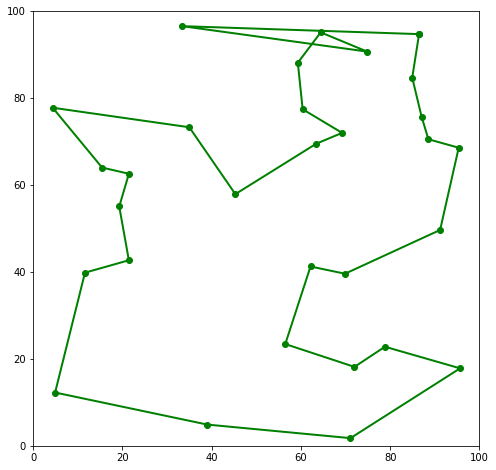

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


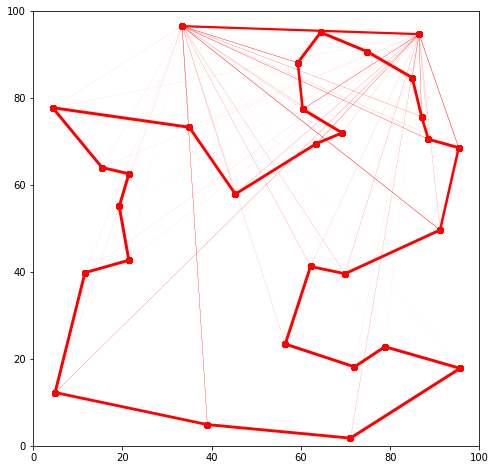

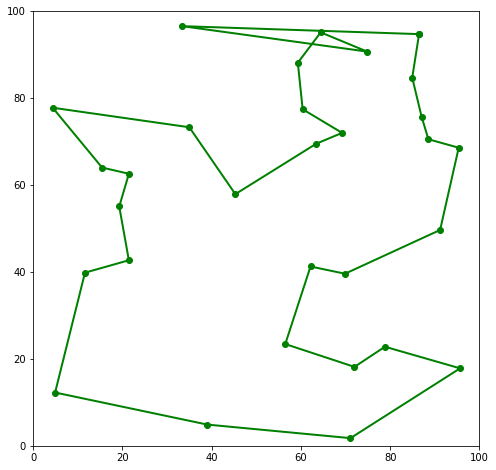

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


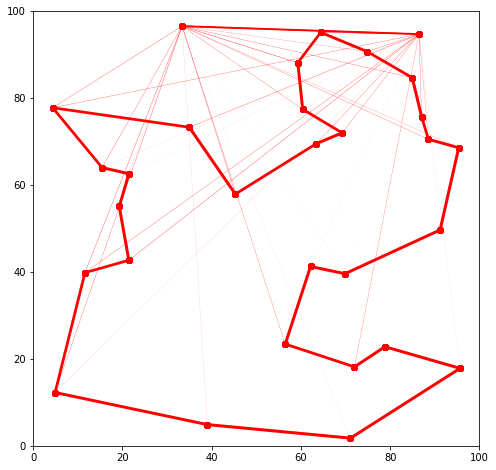

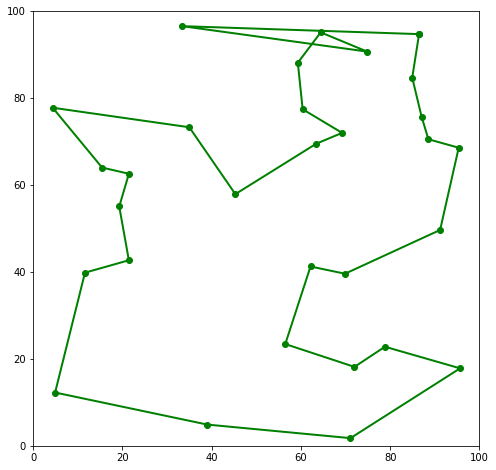

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


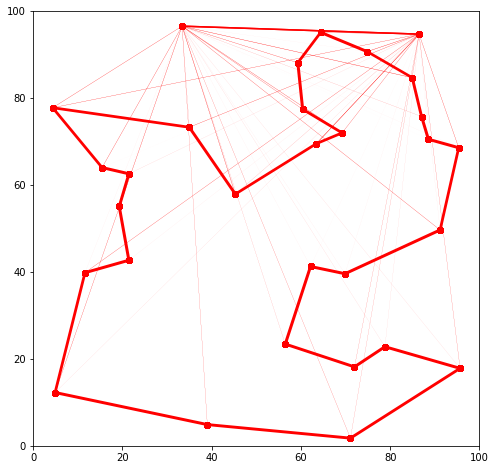

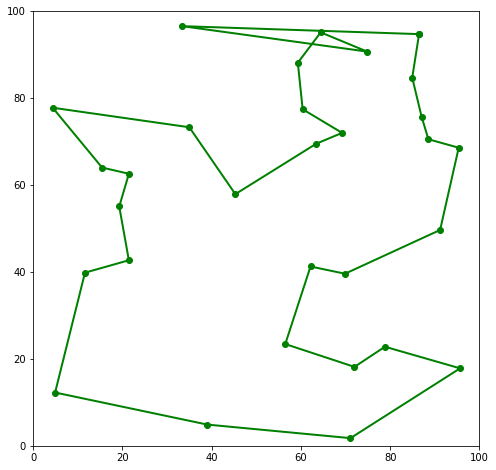

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


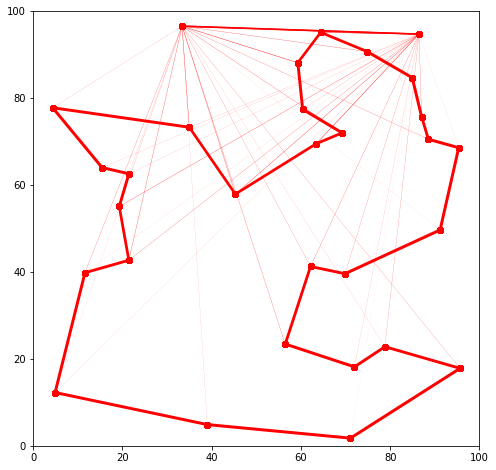

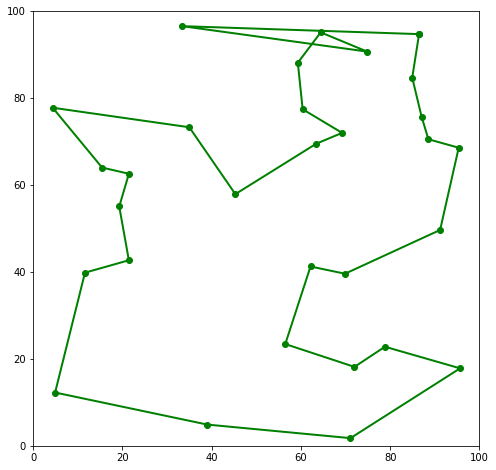

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


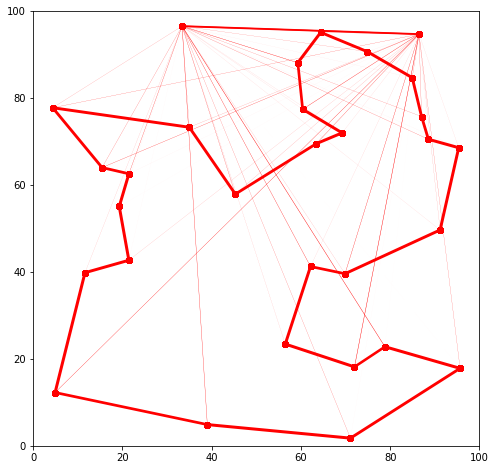

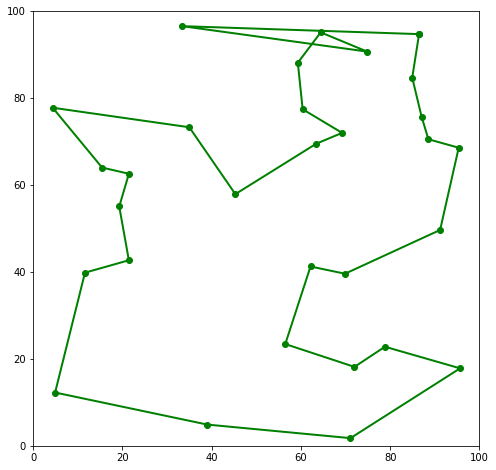

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


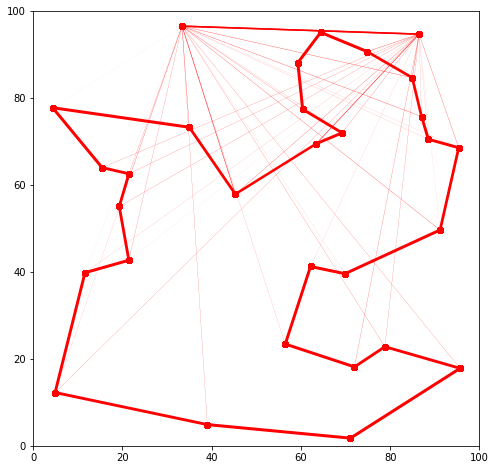

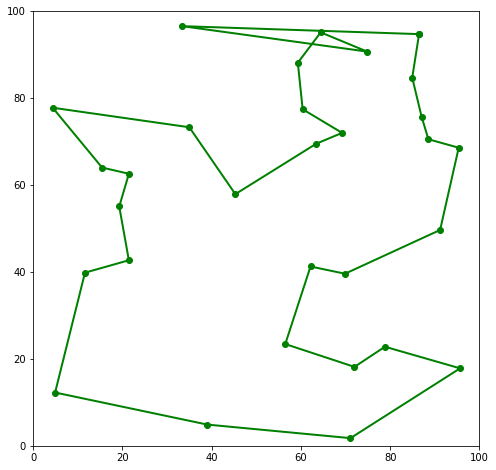

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


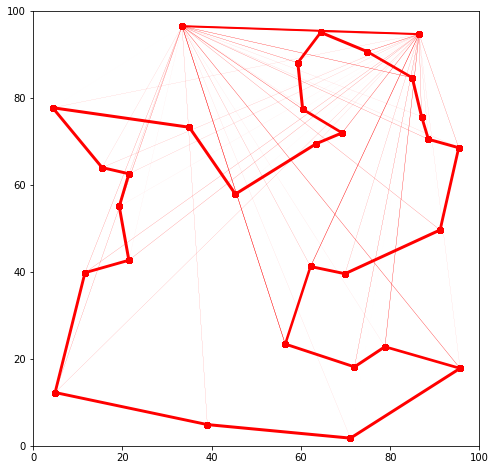

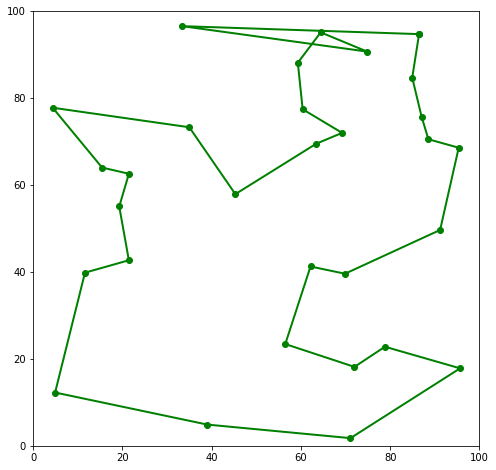

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


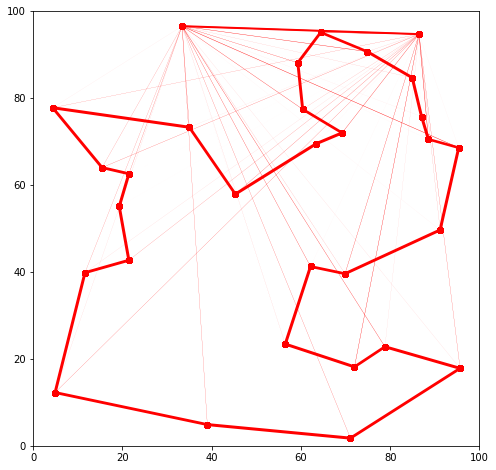

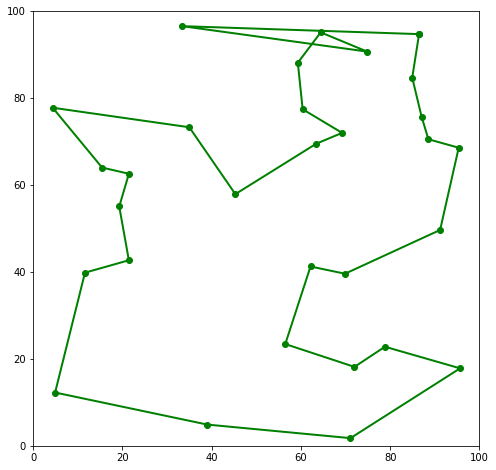

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


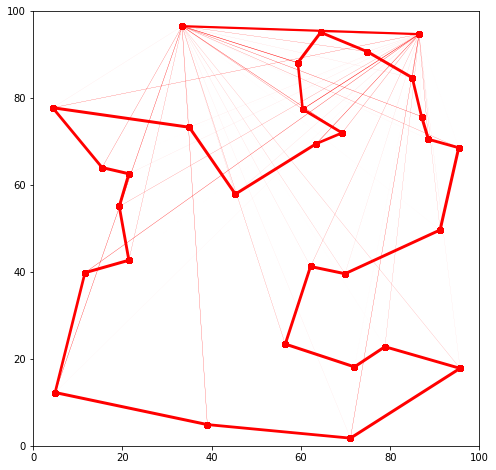

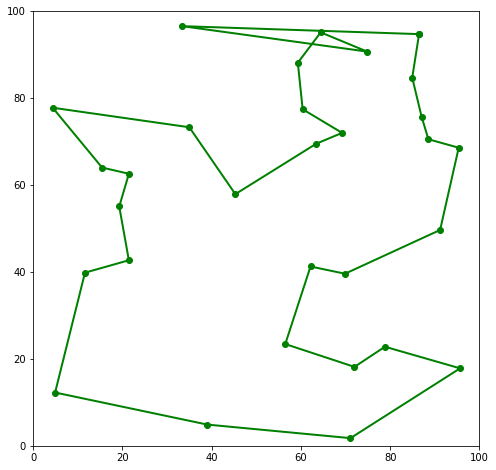

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


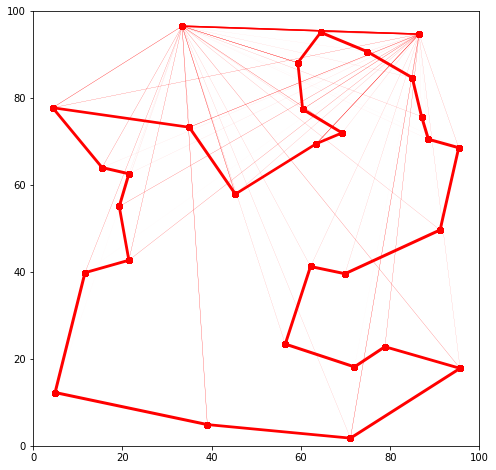

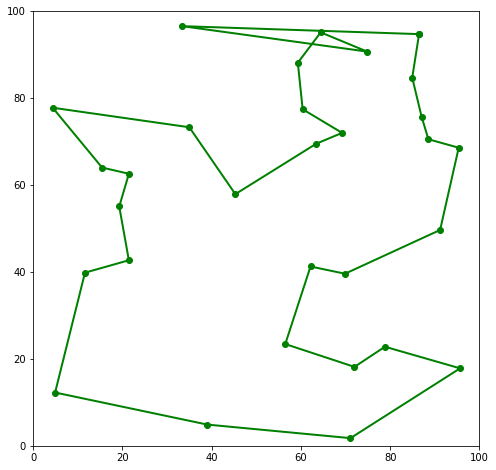

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


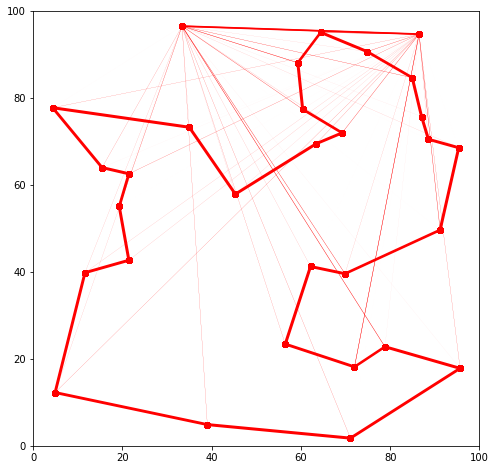

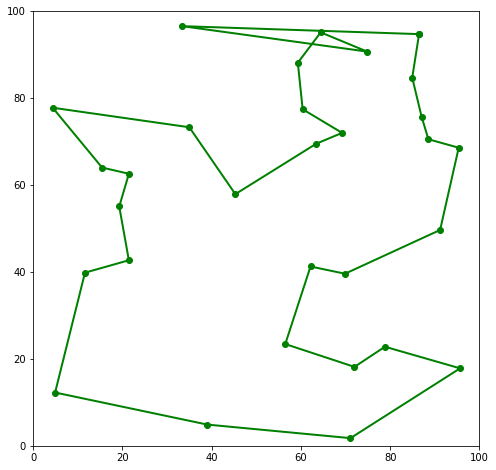

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


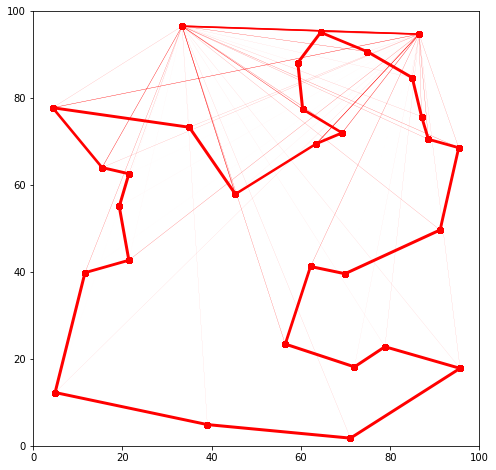

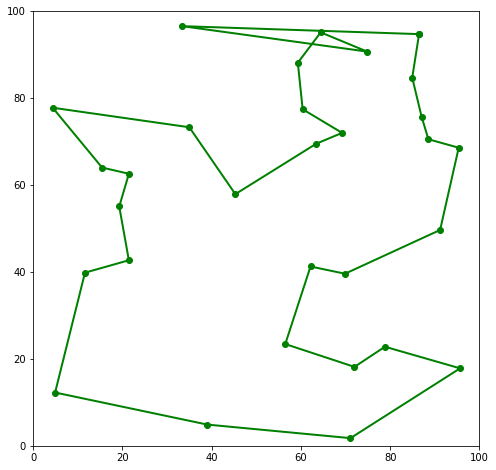

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


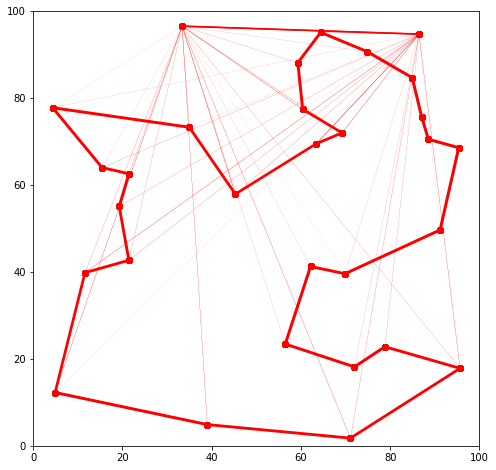

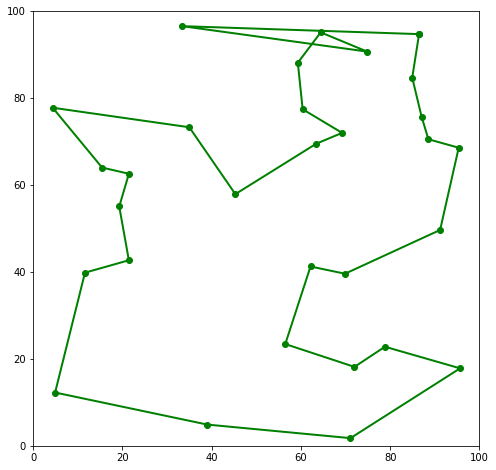

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


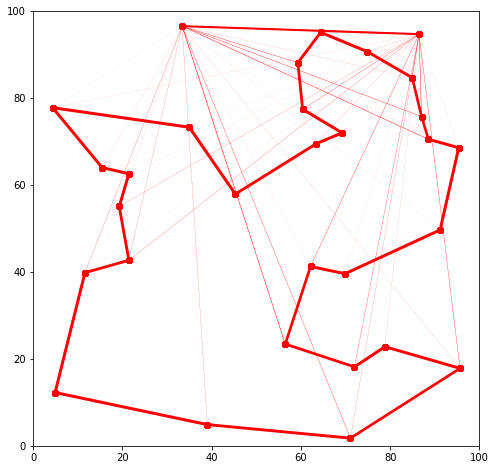

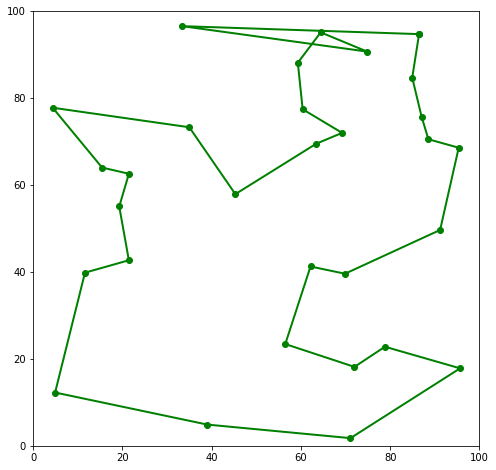

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


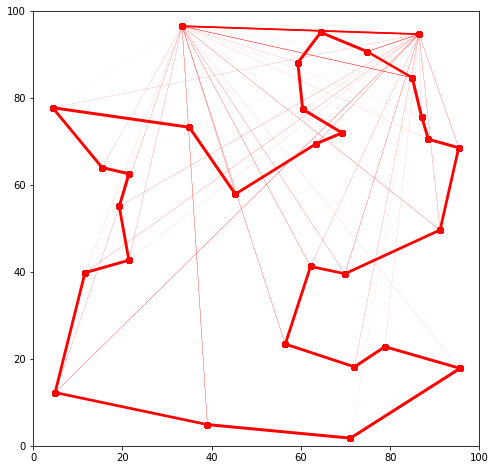

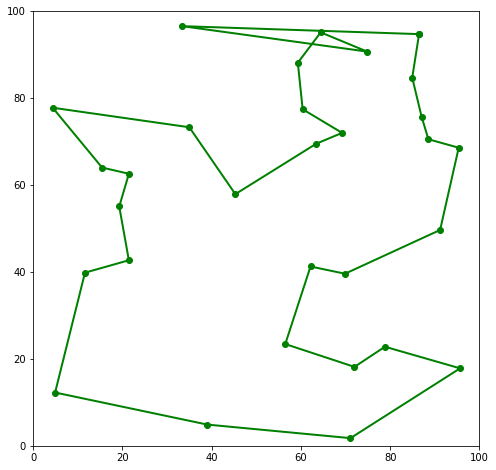

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


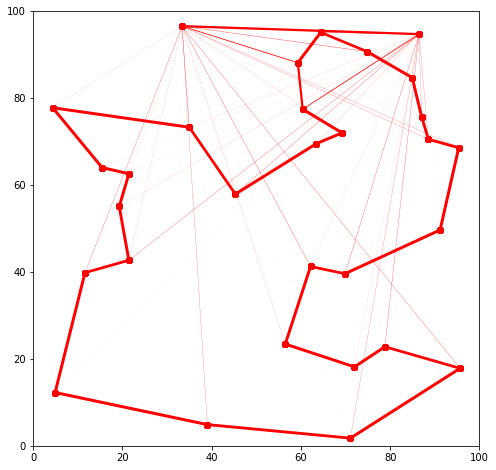

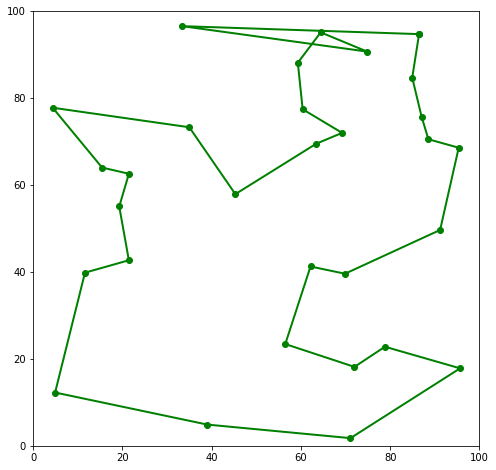

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


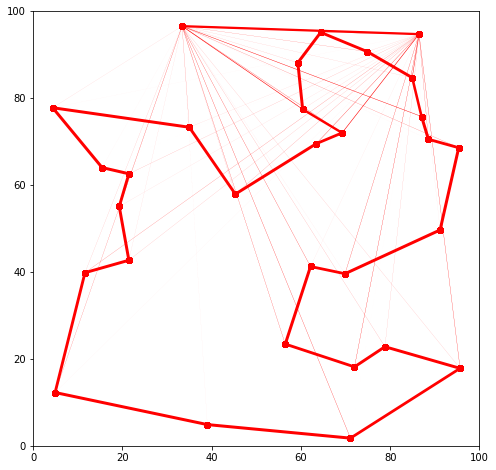

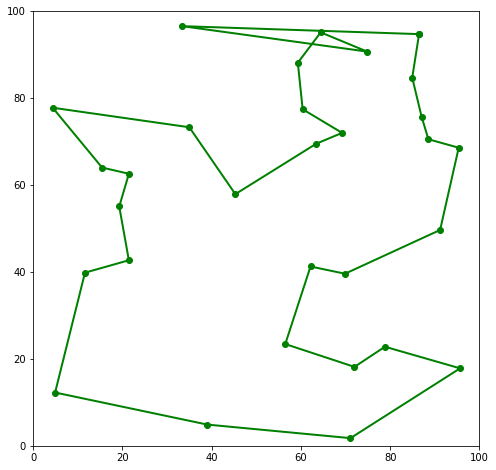

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


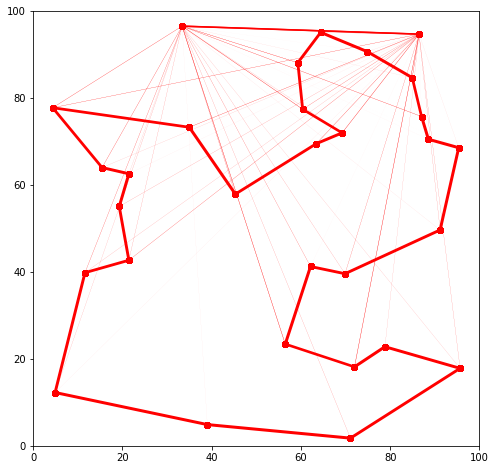

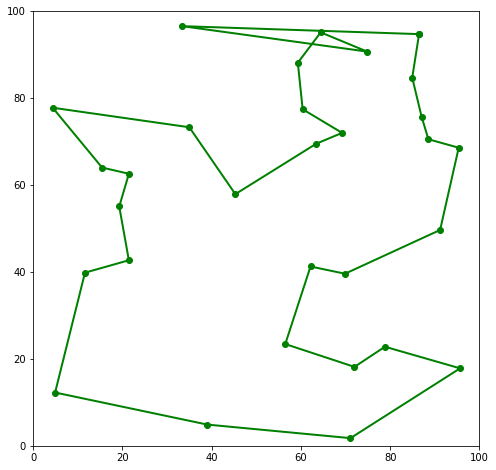

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


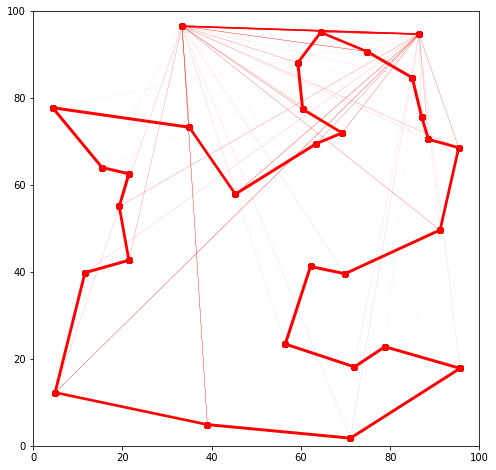

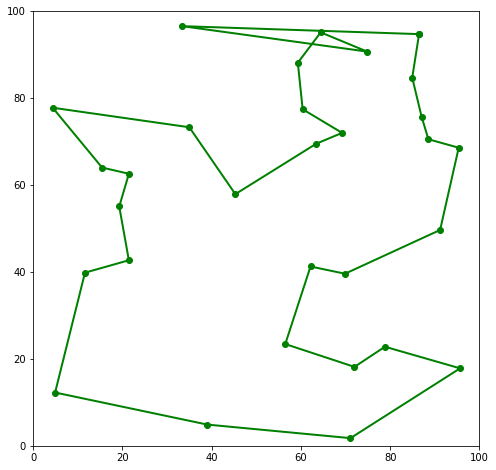

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


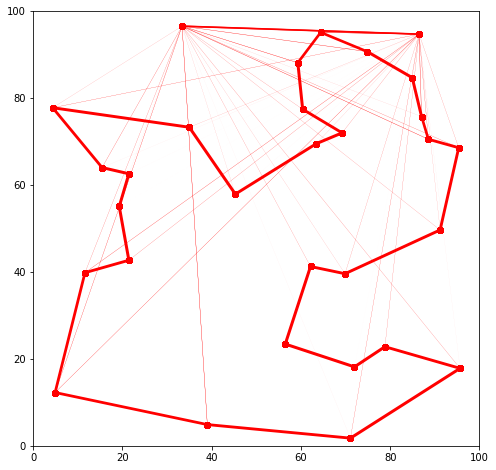

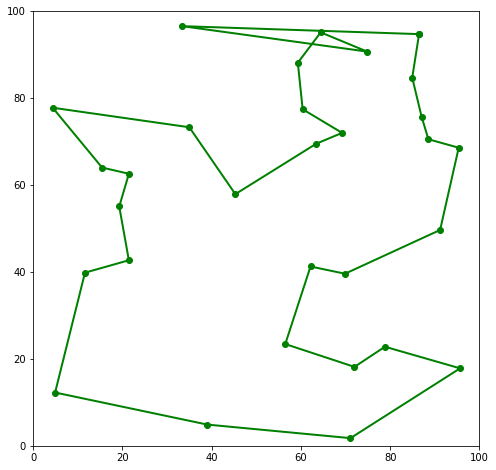

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


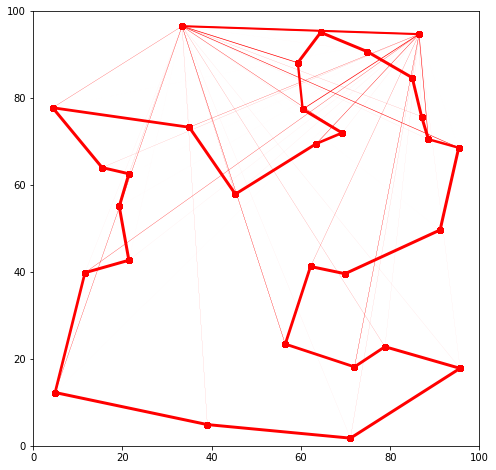

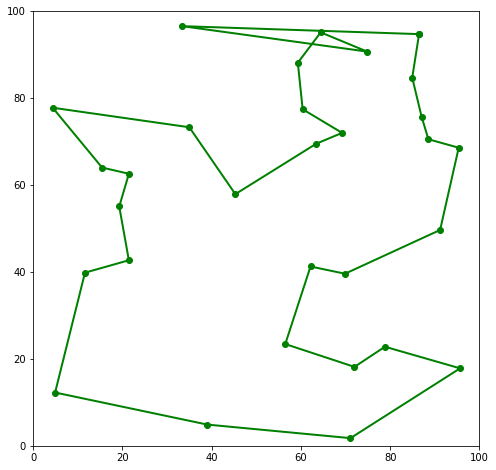

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


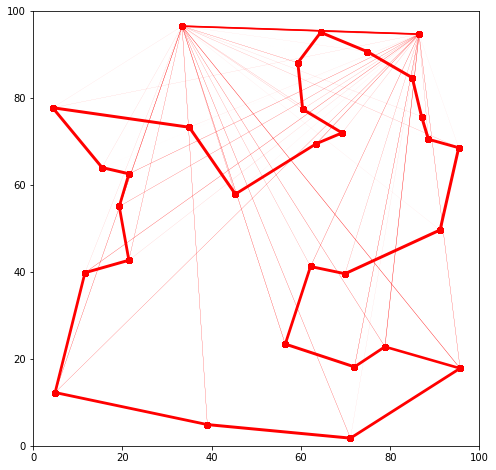

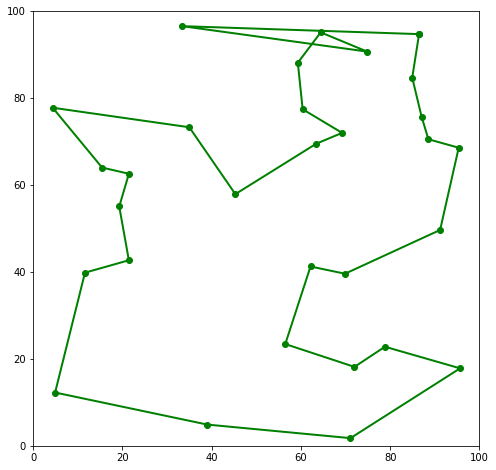

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


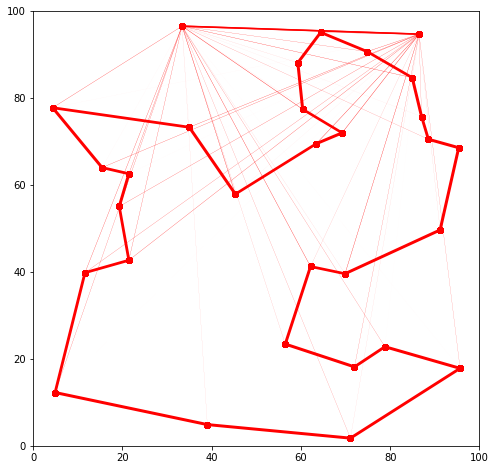

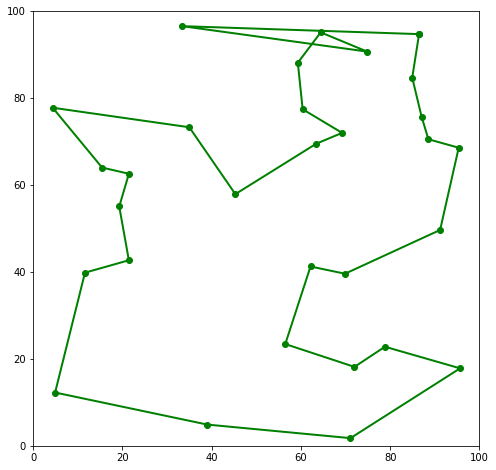

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


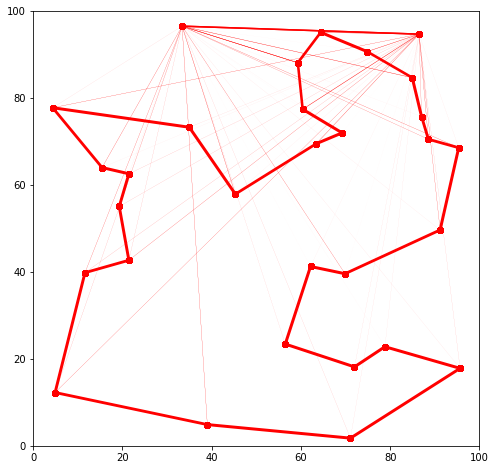

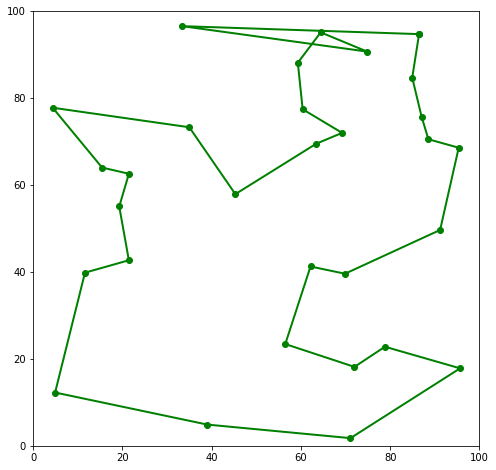

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


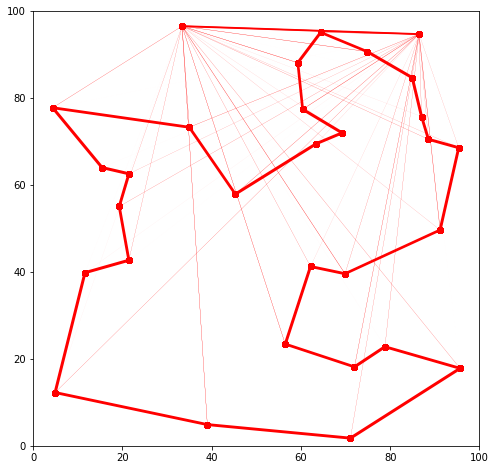

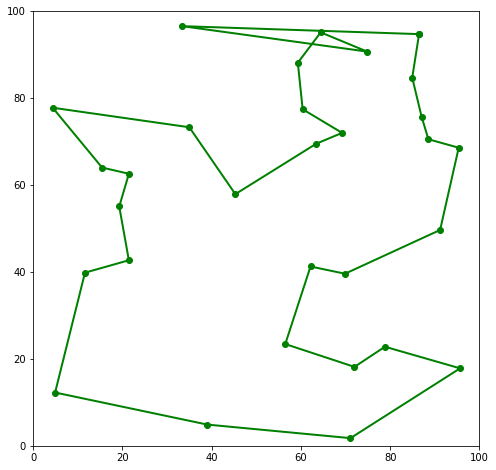

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


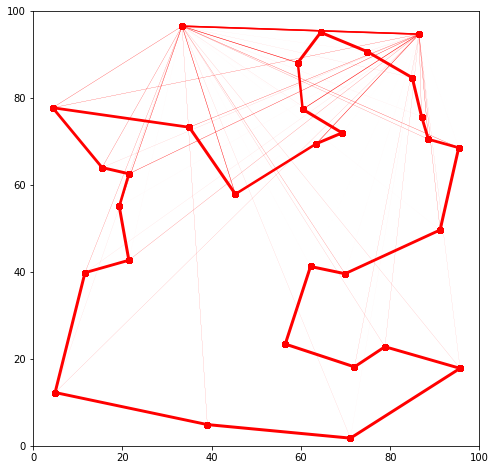

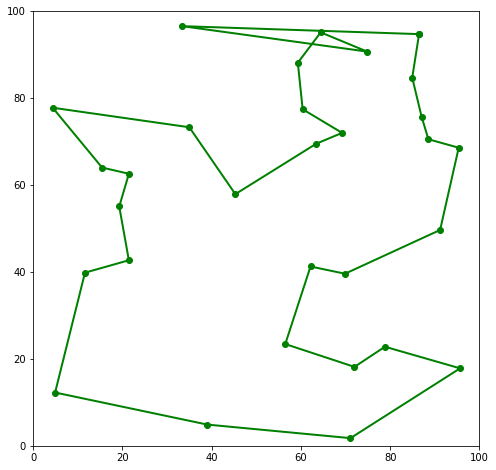

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


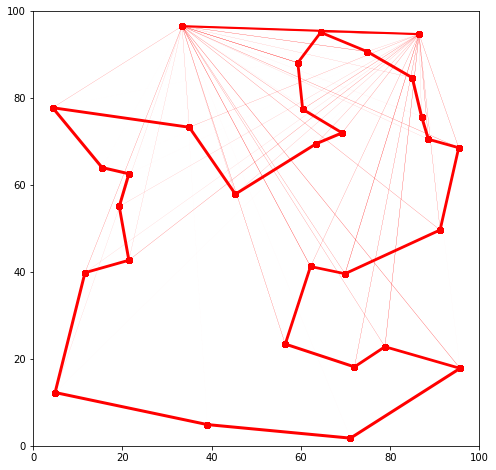

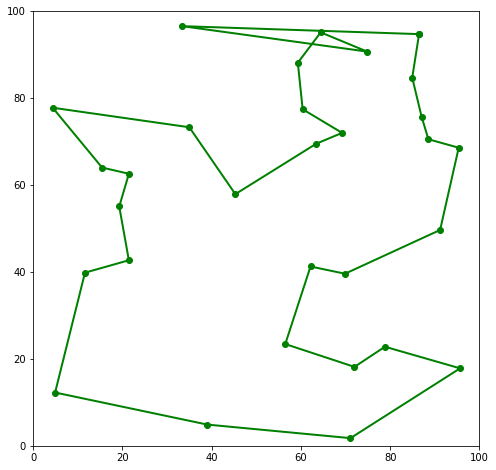

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


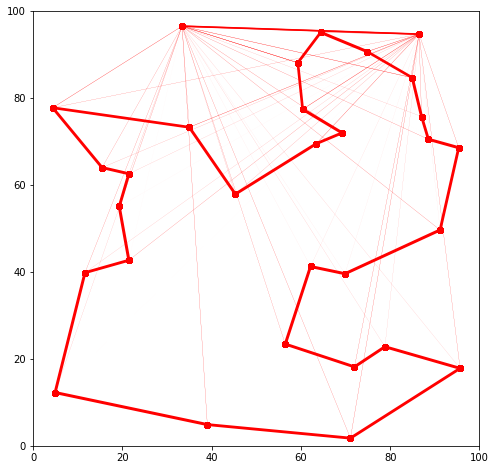

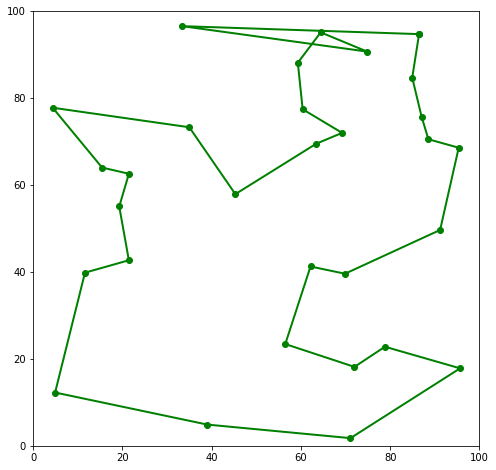

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


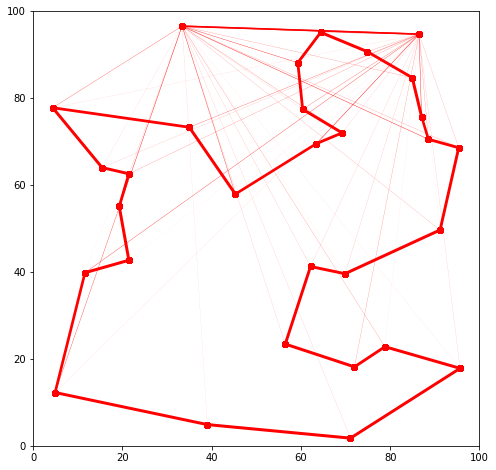

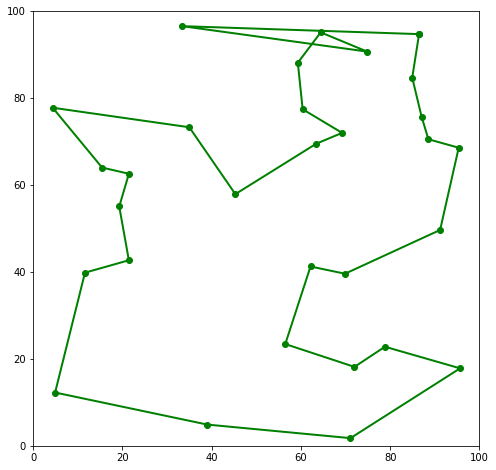

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


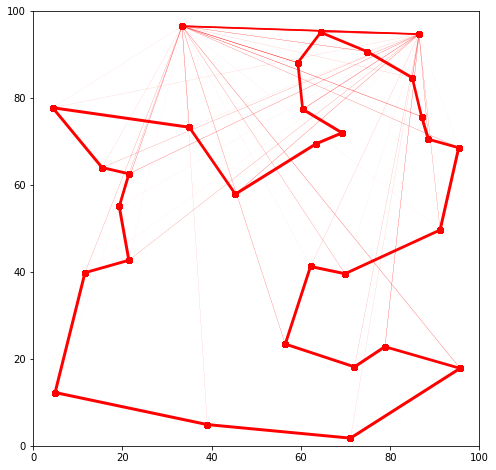

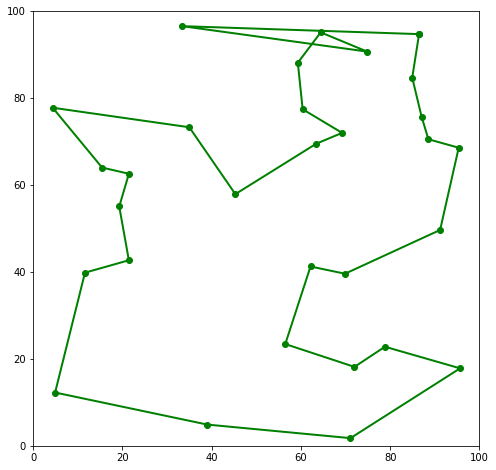

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


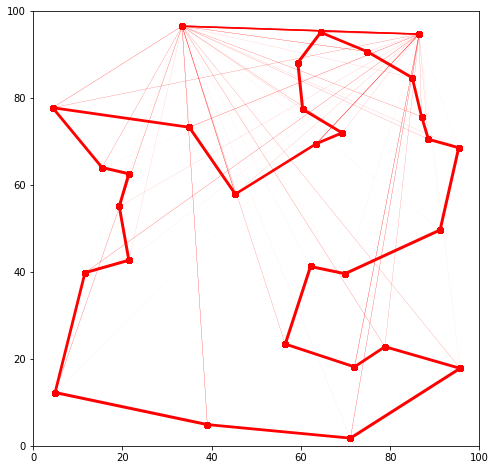

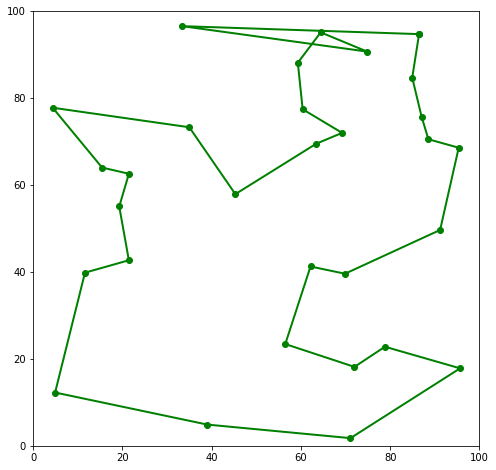

['3', '15', '20', '22', '4', '17', '5', '9', '0', '14', '2', '21', '8', '27', '16', '11', '18', '23', '25', '12', '29', '6', '10', '1', '7', '24', '19', '28', '13', '26'] 536.1097644065694


(['3',
  '15',
  '20',
  '22',
  '4',
  '17',
  '5',
  '9',
  '0',
  '14',
  '2',
  '21',
  '8',
  '27',
  '16',
  '11',
  '18',
  '23',
  '25',
  '12',
  '29',
  '6',
  '10',
  '1',
  '7',
  '24',
  '19',
  '28',
  '13',
  '26'],
 536.1097644065694)

In [224]:
tsp = TSPrand()
tsp.solve(iterations = 1000, ants = 10, alpha = 1, beta = 1, ro = 0.5, q = 10, display_period = 10)

**Task 4:**

Implement the Knapsack problem. Use ACO to solve it.

In [227]:
class Knapsack(Problem):
   #TODO implement the knapsack problem
    def __init__(self, size=100):
        super().__init__()
        self.weights = [random.randint(5, 15) for _ in range(10)]
        self.costs = [random.randint(1, 10) for _ in range(10)]
        self.size = size
#         for c1 in self.cities:
#             for c2 in self.cities:
#                 self.name_to_id[c1+"-"+c2] = id
#                 self.parts_phero.append(1)
#                 self.parts_phero_delta.append(0)
#                 self.distance.append(self.dist(self.coords[c1][0], self.coords[c1][1],
#                                                self.coords[c2][0], self.coords[c2][1]))
#                 id += 1
#         print(self.name_to_id)

    def possible_choices(self, part_solution):
        raise Exception
    
    def solution_quality(self, solution):
        return sum([self.weights[part_sol] * self.costs[part_sol] for part_sol in solution])
    
    def solution_parts(self, solution):
        raise Exception
        # DONE?
        # parts - a list of IDs of the edges in the solution
#         parts = [self.name_to_id[solution[i]+"-"+solution[i + 1]] for i in range(len(solution) - 1)]
        parts = [self.cities.index(edge) for edge in solution]
        return parts

    def initial_solution(self):
        raise Exception
        # DONE?
        # init_sol - a random starting point for a new solution (the starting city)
        init_sol = [random.choice(self.cities)]
        
        return init_sol
    
knap = Knapsack(size = 40)
knap.solve(iterations = 100, ants = 100, alpha = 1, beta = 1, ro = 0.5, q = 0.1, display_period = 10)
        

Exception: 